In [ ]:
# !sudo apt-get install -y fonts-nanum
# !sudo fc-cache -fv
# !rm ~/.cache/matplotlib -rf\

In [ ]:
#!nvidia-smi

In [30]:
import pandas as pd
import numpy as np
from google.colab import drive
import matplotlib.pyplot as plt
import warnings
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
from torch.utils.data import TensorDataset, DataLoader
from torch.nn.utils import weight_norm
from torch.autograd import Variable
from datetime import datetime
import pytz
import random
import os
import requests
import json
from pandas import json_normalize
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from sklearn.metrics import mean_squared_error

print(pytz.timezone('UTC').zone)
warnings.filterwarnings(action = 'ignore')
print(torch.cuda.is_available())
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(device)

UTC
True
cuda


In [31]:
# !pip install autogluon

In [32]:
# !pip install --upgrade urllib3

In [33]:
# from autogluon.timeseries import TimeSeriesDataFrame, TimeSeriesPredictor

In [34]:
# train_df = train[['ID','timestamp','supply(kg)', 'price(원/kg)']]

In [35]:
# train_df['item_id'] = train_df.ID.str[0:6]

In [36]:
# data = TimeSeriesDataFrame(train_df.drop(columns=['ID']))
# predictor = TimeSeriesPredictor(
#     prediction_length=28,
#     target="price(원/kg)",
#     eval_metric="RMSE",
# )
# # seed 고정
# predictor.fit( data, random_seed=CFG['SEED'], )

In [37]:
# predictor.refit_full()

In [38]:
# # seed 고정
# pred = predictor.predict(data, random_seed=CFG['SEED'], )

In [39]:
# sample_submission['answer'] = pred.reset_index()['mean']
# sample_submission.loc[ sample_submission['answer'] < 0.0, 'answer'] = 0.0
# sample_submission.to_csv('./submission.csv', index=False)
# sample_submission

In [40]:
CFG = {
    'WINDOW_SIZE':9,
    'FORCAST_SIZE':28,
    'EPOCHS':3,
    'LEARNING_RATE':3e-4,
    'BATCH_SIZE': 32, # 1024,
    'SEED':41
}

In [41]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True
    torch.cuda.manual_seed_all(seed) # multi-gpu seed 고정

seed_everything(CFG['SEED']) # Seed 고정

In [42]:
drive.mount('./content/')

Drive already mounted at ./content/; to attempt to forcibly remount, call drive.mount("./content/", force_remount=True).


In [69]:
folder_dir = '/content/content/MyDrive/JEJU/open/'

In [70]:
international_trade = pd.read_csv(folder_dir+'international_trade.csv')
sample_submission = pd.read_csv(folder_dir+'sample_submission.csv')
test = pd.read_csv(folder_dir+'test.csv')
train = pd.read_csv(folder_dir+'train.csv')

In [71]:
international_trade

,기간,품목명,수출 중량,수출 금액,수입 중량,수입 금액,무역수지
0,2019-01,토마토(신선한 것이나 냉장한 것으로 한정한다),356571,990,0,0,990
1,2019-01,양파,821330,222,4003206,1118,-896
2,2019-01,쪽파,60,1,93405,128,-127
3,2019-01,꽃양배추와 브로콜리(broccoli),160,1,638913,563,-562
4,2019-01,방울다다기 양배추,0,0,7580,38,-38
...,...,...,...,...,...,...,...
1269,2023-02,포포(papaw)[파파야(papaya)],0,0,23830,71,-71
1270,2023-02,사과,135165,351,0,0,351
1271,2023-02,배,2206012,5411,1,0,5411
1272,2023-02,신 체리[프루너스 체라서스(Prunus cerasus)],5,0,0,0,0


In [72]:
len(sample_submission.ID[sample_submission.ID.str.contains('TG_A_J')])

28

In [73]:
test

,ID,timestamp,item,corporation,location
0,TG_A_J_20230304,2023-03-04,TG,A,J
1,TG_A_J_20230305,2023-03-05,TG,A,J
2,TG_A_J_20230306,2023-03-06,TG,A,J
3,TG_A_J_20230307,2023-03-07,TG,A,J
4,TG_A_J_20230308,2023-03-08,TG,A,J
...,...,...,...,...,...
1087,RD_F_J_20230327,2023-03-27,RD,F,J
1088,RD_F_J_20230328,2023-03-28,RD,F,J
1089,RD_F_J_20230329,2023-03-29,RD,F,J
1090,RD_F_J_20230330,2023-03-30,RD,F,J


item: 품목코드

corporation: 유통 법인 코드

location: 지역코드

supply(kg): 유통된 물량, kg단위

price(원/kg): 유통된 품목들의 kg마다의 가격, 원 단위

In [74]:
train

,ID,timestamp,item,corporation,location,supply(kg),price(원/kg)
0,TG_A_J_20190101,2019-01-01,TG,A,J,0.0,0.0
1,TG_A_J_20190102,2019-01-02,TG,A,J,0.0,0.0
2,TG_A_J_20190103,2019-01-03,TG,A,J,60601.0,1728.0
3,TG_A_J_20190104,2019-01-04,TG,A,J,25000.0,1408.0
4,TG_A_J_20190105,2019-01-05,TG,A,J,32352.0,1250.0
...,...,...,...,...,...,...,...
59392,RD_F_J_20230227,2023-02-27,RD,F,J,452440.0,468.0
59393,RD_F_J_20230228,2023-02-28,RD,F,J,421980.0,531.0
59394,RD_F_J_20230301,2023-03-01,RD,F,J,382980.0,574.0
59395,RD_F_J_20230302,2023-03-02,RD,F,J,477220.0,523.0


In [75]:
train.loc[train['supply(kg)'] == 0.0, 'price(원/kg)'].value_counts() # 공급이 0이면 가격도 0

0.0    35452
Name: price(원/kg), dtype: int64

In [76]:
def korean_translation(item):
  if item == 'TG':
    return '감귤'
  elif item == 'BC':
    return '브로콜리'
  elif item == 'RD':
    return '무'
  elif item == 'CR':
    return '당근'
  elif item == 'CB':
    return '양배추'
  else:
    return np.nan

train['item'] = train['item'].apply(korean_translation)
test['item'] = test['item'].apply(korean_translation)

In [77]:
train.groupby(['location'])['corporation'].unique()

location
J    [A, B, C, D, E, F]
S       [A, B, C, D, E]
Name: corporation, dtype: object

In [78]:
train.groupby(['corporation'])['item'].unique()

corporation
A    [감귤, 당근, 양배추, 무, 브로콜리]
B            [감귤, 당근, 브로콜리]
C         [감귤, 당근, 무, 브로콜리]
D    [감귤, 당근, 양배추, 무, 브로콜리]
E    [감귤, 당근, 양배추, 무, 브로콜리]
F                  [양배추, 무]
Name: item, dtype: object

In [79]:
test.groupby(['location'])['corporation'].unique()

location
J    [A, B, C, D, E, F]
S       [A, B, C, D, E]
Name: corporation, dtype: object

In [80]:
test.groupby(['corporation'])['item'].unique()

corporation
A    [감귤, 당근, 양배추, 무, 브로콜리]
B            [감귤, 당근, 브로콜리]
C         [감귤, 당근, 무, 브로콜리]
D    [감귤, 당근, 양배추, 무, 브로콜리]
E    [감귤, 당근, 양배추, 무, 브로콜리]
F                  [양배추, 무]
Name: item, dtype: object

제주시에는 유통 법인 A, B, C, D, E, F 가 존재하고

반면에 서귀포시에는 유통 법인이 A, B, C, D, E 가 존재합니다.

또한 유통 법인 A는 [감귤, 당근, 양배추, 무, 브로콜리] 품목을 유통하고

유통 법인 B는 [감귤, 당근, 브로콜리] 품목을 유통합니다.

유통 법인 C, D, E, F 도 각각 다른 품목을 유통하는 것을 확인하였습니다.

--> 데이터프레임을 {품목명} _ {유통법인 코드} _ {지역코드} _ price(원/kg) 형태가 되도록 피벗테이블 생성



In [81]:
pivot_train = train.pivot_table(index = ['timestamp'], columns = ['item', 'corporation', 'location'], values = 'price(원/kg)')
pivot_train.columns = [f'{item}_{corporation}_{location}_price(원/kg)' for (item, corporation, location) in pivot_train.columns]

In [82]:
test['price(원/kg)'] = 0.0
pivot_test = test.pivot_table(index = ['timestamp'], columns = ['item', 'corporation', 'location'], values = 'price(원/kg)')
pivot_test.columns = [f'{item}_{corporation}_{location}_price(원/kg)' for (item, corporation, location) in pivot_test.columns]

In [83]:
pivot_train = pivot_train.reset_index()
pivot_test = pivot_test.reset_index()

In [84]:
pivot_train

,timestamp,감귤_A_J_price(원/kg),감귤_A_S_price(원/kg),감귤_B_J_price(원/kg),감귤_B_S_price(원/kg),감귤_C_J_price(원/kg),감귤_C_S_price(원/kg),감귤_D_J_price(원/kg),감귤_D_S_price(원/kg),감귤_E_J_price(원/kg),...,브로콜리_C_J_price(원/kg),브로콜리_C_S_price(원/kg),브로콜리_D_J_price(원/kg),브로콜리_E_J_price(원/kg),브로콜리_E_S_price(원/kg),양배추_A_J_price(원/kg),양배추_A_S_price(원/kg),양배추_D_J_price(원/kg),양배추_E_J_price(원/kg),양배추_F_J_price(원/kg)
0,2019-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2019-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2019-01-03,1728.0,2526.0,1692.0,1944.0,1965.0,2078.0,1616.0,2048.0,1692.0,...,2079.0,0.0,2253.0,2379.0,0.0,0.0,510.0,0.0,0.0,478.0
3,2019-01-04,1408.0,2134.0,1516.0,1815.0,1794.0,2002.0,1337.0,1757.0,1475.0,...,2020.0,0.0,2175.0,2257.0,2301.0,0.0,534.0,0.0,0.0,600.0
4,2019-01-05,1250.0,2075.0,1471.0,1717.0,1773.0,1815.0,1234.0,1719.0,1392.0,...,1849.0,1625.0,1981.0,1857.0,1880.0,374.0,511.0,0.0,0.0,536.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1518,2023-02-27,2657.0,4166.0,3540.0,4057.0,5037.0,4180.0,0.0,3409.0,2620.0,...,1859.0,0.0,2473.0,2492.0,2488.0,1438.0,0.0,748.0,0.0,652.0
1519,2023-02-28,3922.0,4009.0,3141.0,3821.0,2643.0,4234.0,0.0,3236.0,1673.0,...,2873.0,0.0,2896.0,3480.0,3232.0,710.0,0.0,809.0,0.0,672.0
1520,2023-03-01,3397.0,4173.0,6382.0,4037.0,3742.0,4357.0,0.0,4631.0,0.0,...,2839.0,0.0,3487.0,3793.0,3816.0,488.0,680.0,798.0,0.0,621.0
1521,2023-03-02,3195.0,4219.0,3558.0,4004.0,3983.0,4466.0,0.0,4114.0,1904.0,...,2070.0,0.0,3185.0,3144.0,3321.0,1312.0,821.0,858.0,0.0,653.0


In [85]:
pivot_test

,timestamp,감귤_A_J_price(원/kg),감귤_A_S_price(원/kg),감귤_B_J_price(원/kg),감귤_B_S_price(원/kg),감귤_C_J_price(원/kg),감귤_C_S_price(원/kg),감귤_D_J_price(원/kg),감귤_D_S_price(원/kg),감귤_E_J_price(원/kg),...,브로콜리_C_J_price(원/kg),브로콜리_C_S_price(원/kg),브로콜리_D_J_price(원/kg),브로콜리_E_J_price(원/kg),브로콜리_E_S_price(원/kg),양배추_A_J_price(원/kg),양배추_A_S_price(원/kg),양배추_D_J_price(원/kg),양배추_E_J_price(원/kg),양배추_F_J_price(원/kg)
0,2023-03-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2023-03-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2023-03-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2023-03-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2023-03-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,2023-03-09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,2023-03-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,2023-03-11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,2023-03-12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,2023-03-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


공공데이터포털 OpenAPI 조회

In [86]:
key = 'JzOEaocVyAKp%2F%2BAnHTPEHM%2Buf0KYwhiSjfd%2B%2FEN9gxQSWiblmKiErIbRlriXTfUMJoTVFvN%2FjCuKCdJhqjJPiA%3D%3D'

today_year = 2019

url = 'http://apis.data.go.kr/B090041/openapi/service/SpcdeInfoService/getRestDeInfo?_type=json&numOfRows=50&solYear=' + str(today_year) + '&ServiceKey=' + str(key)
response = requests.get(url)
if response.status_code == 200:
	json_ob = json.loads(response.text)
	holidays_data = json_ob['response']['body']['items']['item']
	df_2019 = json_normalize(holidays_data)

today_year = 2020

url = 'http://apis.data.go.kr/B090041/openapi/service/SpcdeInfoService/getRestDeInfo?_type=json&numOfRows=50&solYear=' + str(today_year) + '&ServiceKey=' + str(key)
response = requests.get(url)
if response.status_code == 200:
	json_ob = json.loads(response.text)
	holidays_data = json_ob['response']['body']['items']['item']
	df_2020 = json_normalize(holidays_data)

today_year = 2021

url = 'http://apis.data.go.kr/B090041/openapi/service/SpcdeInfoService/getRestDeInfo?_type=json&numOfRows=50&solYear=' + str(today_year) + '&ServiceKey=' + str(key)
response = requests.get(url)
if response.status_code == 200:
	json_ob = json.loads(response.text)
	holidays_data = json_ob['response']['body']['items']['item']
	df_2021 = json_normalize(holidays_data)

today_year = 2022

url = 'http://apis.data.go.kr/B090041/openapi/service/SpcdeInfoService/getRestDeInfo?_type=json&numOfRows=50&solYear=' + str(today_year) + '&ServiceKey=' + str(key)
response = requests.get(url)
if response.status_code == 200:
	json_ob = json.loads(response.text)
	holidays_data = json_ob['response']['body']['items']['item']
	df_2022 = json_normalize(holidays_data)


today_year = 2023

url = 'http://apis.data.go.kr/B090041/openapi/service/SpcdeInfoService/getRestDeInfo?_type=json&numOfRows=50&solYear=' + str(today_year) + '&ServiceKey=' + str(key)
response = requests.get(url)
if response.status_code == 200:
	json_ob = json.loads(response.text)
	holidays_data = json_ob['response']['body']['items']['item']
	df_2023 = json_normalize(holidays_data)

In [87]:
df_holiday = pd.concat([df_2019, df_2020, df_2021, df_2022, df_2023], axis = 0)
df_holiday.drop(['dateKind', 'dateName', 'seq'], axis = 1, inplace= True)

In [88]:
df_holiday = df_holiday.rename(columns = {'locdate':'timestamp'})
df_holiday.timestamp = df_holiday.timestamp.astype(str)
pivot_train.timestamp = pivot_train.timestamp.str.replace('-', '')

In [89]:
pivot_train = pd.merge(pivot_train, df_holiday, on = 'timestamp', how = 'left')
pivot_test = pd.merge(pivot_test, df_holiday, on = 'timestamp', how = 'left')

In [90]:
def get_week(pivot):
  pivot.timestamp = pd.to_datetime(pivot.timestamp)#.dt.tz_localize(pytz.timezone('Asia/Seoul'))
  pivot['YEAR'] = pivot.timestamp.dt.year
  pivot['MONTH'] = pivot.timestamp.dt.month
  pivot['DAY'] = pivot.timestamp.dt.day
  pivot['DAY_OF_WEEK'] =pivot.timestamp.dt.dayofweek
  pivot['WEEKDAY'] = pivot.timestamp.dt.weekday.astype(float)
  pivot['WEEKEND'] = pivot.WEEKDAY.apply(lambda x: 1 if x >= 5 else 0).astype(float)

  return pivot

pivot_train = get_week(pivot_train)
pivot_test = get_week(pivot_test)

In [91]:
def acf_plot(pivot, item_name):
  item_name_included = pivot.columns[pivot.columns.str.contains(item_name)]
  fig, (ax1, ax2) = plt.subplots(2, 1, figsize = (12, 5))
  for idx, col in enumerate(item_name_included):
    plot_acf(pivot[col], ax = ax1)
    plot_pacf(pivot[col], ax = ax2)
  plt.tight_layout()
  plt.xticks([])
  plt.show()

def seasonal_plot(pivot, item_name):
  item_name_included = pivot.columns[pivot.columns.str.contains(item_name)]
  axvline2019 = pivot.loc[pivot.timestamp == '20190101'].index
  axvline2020 = pivot.loc[pivot.timestamp == '20200101'].index
  axvline2021 = pivot.loc[pivot.timestamp == '20210101'].index
  axvline2022 = pivot.loc[pivot.timestamp == '20220101'].index
  axvline2023 = pivot.loc[pivot.timestamp == '20230101'].index

  max_value = 0.0
  for idx, col in enumerate(item_name_included):
    result = seasonal_decompose(pivot[col], model = 'additive', period = 12)
    trend = result.trend
    seasonal = result.seasonal
    residual = result.resid

    if max_value < max(pivot[col]):
      max_value = max(pivot[col])

    plt.figure(figsize = (12, 5))
    plt.subplot(4, 1, 1)
    plt.plot(pivot[col], label = 'data')

    plt.axvline(axvline2019, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2020, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2021, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2022, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2023, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.legend()
    plt.title(f'{col} data')

    plt.subplot(4, 1, 2)
    plt.plot(trend, label = 'trend')

    plt.axvline(axvline2019, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2020, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2021, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2022, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2023, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.legend()
    plt.title(f'{col} trend')

    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label = 'seasonal')

    plt.axvline(axvline2019, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2020, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2021, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2022, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2023, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.legend()
    plt.title(f'{col} seasonal')

    plt.subplot(4, 1, 4)
    plt.plot(residual, label = 'residual')

    plt.axvline(axvline2019, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2020, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2021, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2022, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2023, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.legend()
    plt.title(f'{col} residual')

  plt.show()

In [92]:
def trends_plot(pivot, item_name, redline):
  item_name_included = pivot.columns[pivot.columns.str.contains(item_name)]
  plt.figure(figsize = (20, 5))
  axvline2019 = pivot.loc[pivot.timestamp == '20190101'].index
  axvline2020 = pivot.loc[pivot.timestamp == '20200101'].index
  axvline2021 = pivot.loc[pivot.timestamp == '20210101'].index
  axvline2022 = pivot.loc[pivot.timestamp == '20220101'].index
  axvline2023 = pivot.loc[pivot.timestamp == '20230101'].index
  max_value = 0.0
  for idx, col in enumerate(item_name_included):
    plt.plot(pivot.index, pivot[col], label = f'{col}')
    if max_value < max(pivot[col]):
      max_value = max(pivot[col])
  if redline:
    plt.axvline(axvline2019, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2020, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2021, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2022, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
    plt.axvline(axvline2023, 0, max_value, color = 'red', linestyle = '--', linewidth = 2)
  plt.title(f'{item_name} trends plot')
  plt.xticks([])
  plt.legend()
  plt.show()

감귤


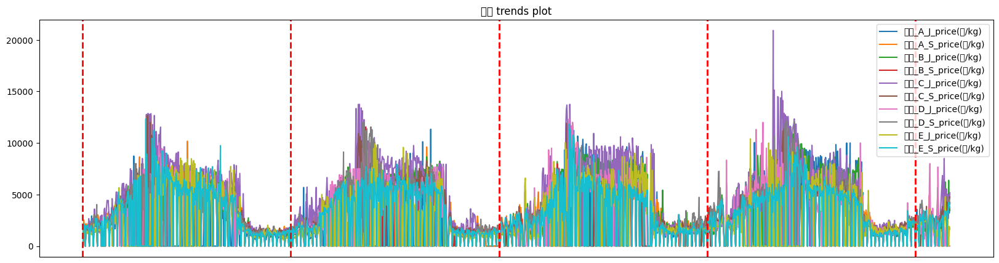

당근


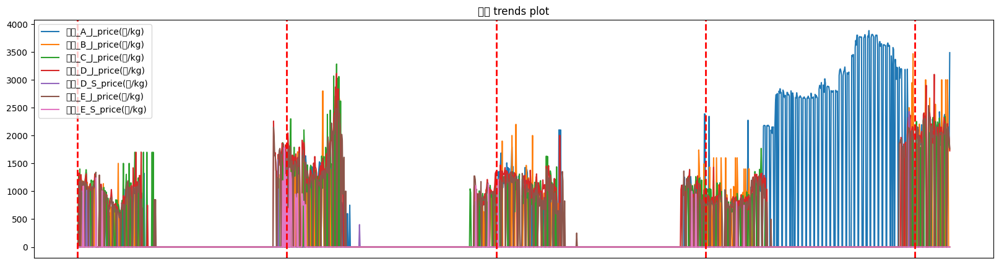

양배추


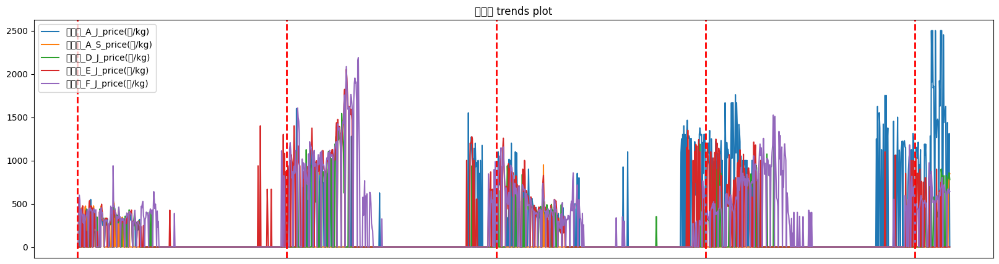

무


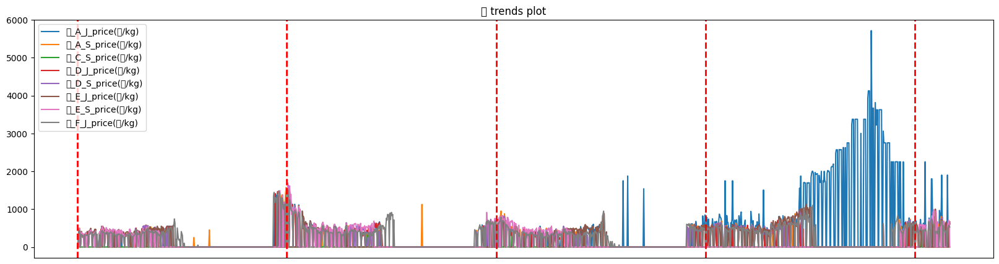

브로콜리


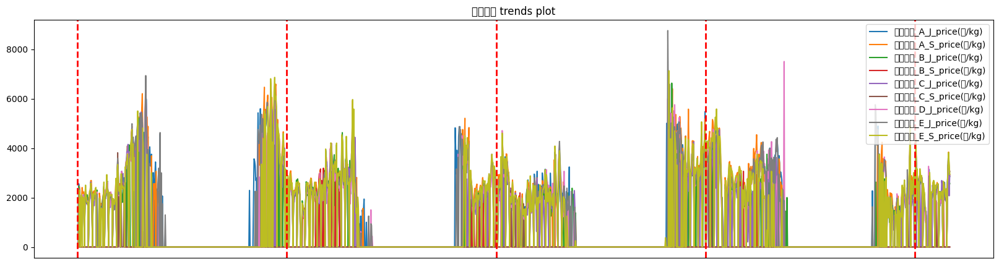

In [93]:
for idx, item_name in enumerate(list(train.item.unique())):
  print(item_name)
  trends_plot(pivot_train, item_name, True)

In [94]:
holiday_temp = pivot_train[pivot_train['isHoliday'] == 'Y']
holiday_temp

,timestamp,감귤_A_J_price(원/kg),감귤_A_S_price(원/kg),감귤_B_J_price(원/kg),감귤_B_S_price(원/kg),감귤_C_J_price(원/kg),감귤_C_S_price(원/kg),감귤_D_J_price(원/kg),감귤_D_S_price(원/kg),감귤_E_J_price(원/kg),...,양배추_D_J_price(원/kg),양배추_E_J_price(원/kg),양배추_F_J_price(원/kg),isHoliday,YEAR,MONTH,DAY,DAY_OF_WEEK,WEEKDAY,WEEKEND
0,2019-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,Y,2019,1,1,1,1.0,0.0
34,2019-02-04,1831.0,2475.0,1724.0,2451.0,3009.0,2381.0,1960.0,2133.0,2199.0,...,346.0,177.0,0.0,Y,2019,2,4,0,0.0,0.0
35,2019-02-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,Y,2019,2,5,1,1.0,0.0
36,2019-02-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,Y,2019,2,6,2,2.0,0.0
59,2019-03-01,4307.0,3262.0,3604.0,3518.0,5223.0,3590.0,3405.0,3294.0,2723.0,...,412.0,364.0,393.0,Y,2019,3,1,4,4.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1481,2023-01-21,1502.0,2527.0,932.0,2195.0,2852.0,3850.0,0.0,3019.0,2815.0,...,0.0,650.0,508.0,Y,2023,1,21,5,5.0,1.0
1482,2023-01-22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,Y,2023,1,22,6,6.0,1.0
1483,2023-01-23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,Y,2023,1,23,0,0.0,0.0
1484,2023-01-24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,Y,2023,1,24,1,1.0,0.0


감귤


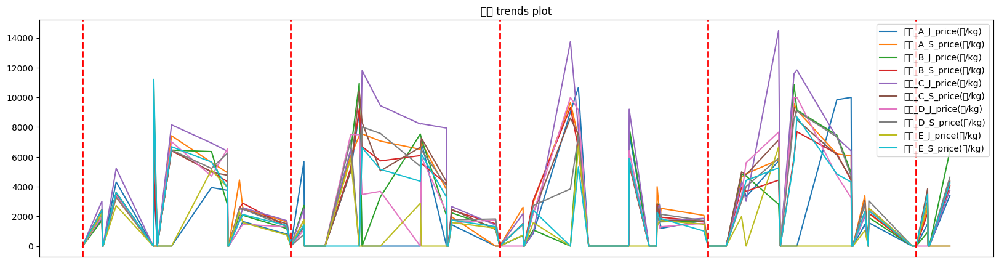

당근


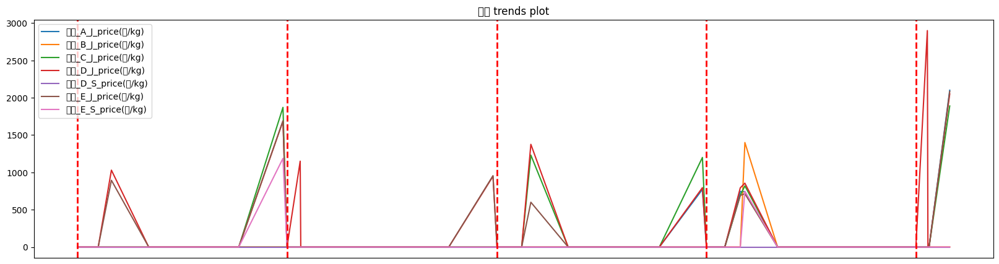

양배추


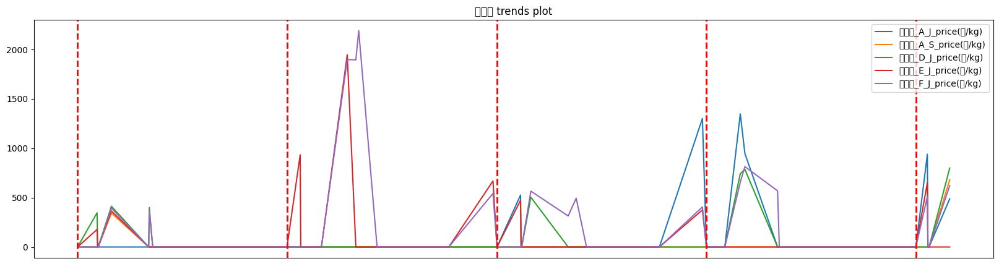

무


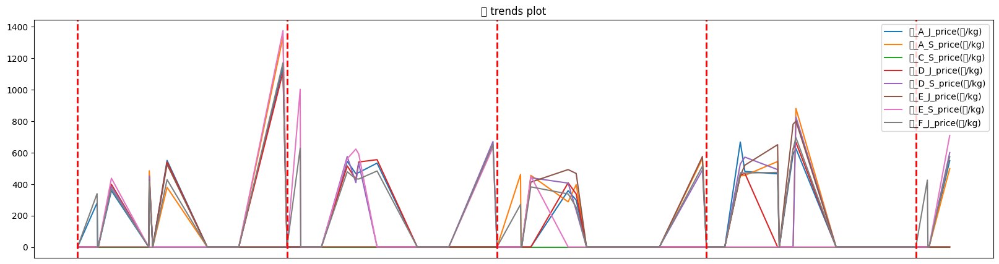

브로콜리


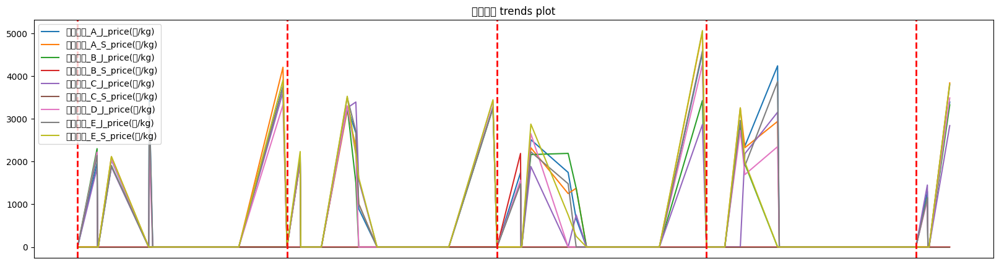

In [95]:
for idx, item_name in enumerate(list(train.item.unique())):
  print(item_name)
  trends_plot(holiday_temp, item_name, True)

In [96]:
weekend_temp = pivot_train[pivot_train['WEEKEND'] == 1]
weekend_temp

,timestamp,감귤_A_J_price(원/kg),감귤_A_S_price(원/kg),감귤_B_J_price(원/kg),감귤_B_S_price(원/kg),감귤_C_J_price(원/kg),감귤_C_S_price(원/kg),감귤_D_J_price(원/kg),감귤_D_S_price(원/kg),감귤_E_J_price(원/kg),...,양배추_D_J_price(원/kg),양배추_E_J_price(원/kg),양배추_F_J_price(원/kg),isHoliday,YEAR,MONTH,DAY,DAY_OF_WEEK,WEEKDAY,WEEKEND
4,2019-01-05,1250.0,2075.0,1471.0,1717.0,1773.0,1815.0,1234.0,1719.0,1392.0,...,0.0,0.0,536.0,NaN,2019,1,5,5,5.0,1.0
5,2019-01-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,2019,1,6,6,6.0,1.0
11,2019-01-12,1374.0,2156.0,1195.0,1614.0,2662.0,1497.0,1250.0,1365.0,1214.0,...,0.0,261.0,378.0,NaN,2019,1,12,5,5.0,1.0
12,2019-01-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,2019,1,13,6,6.0,1.0
18,2019-01-19,1330.0,2168.0,1463.0,1741.0,2672.0,1812.0,1302.0,1641.0,1428.0,...,339.0,0.0,398.0,NaN,2019,1,19,5,5.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1503,2023-02-12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,2023,2,12,6,6.0,1.0
1509,2023-02-18,2404.0,3286.0,3862.0,3332.0,6841.0,3809.0,0.0,2688.0,0.0,...,827.0,0.0,804.0,NaN,2023,2,18,5,5.0,1.0
1510,2023-02-19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,2023,2,19,6,6.0,1.0
1516,2023-02-25,3155.0,4201.0,2412.0,3677.0,5550.0,4298.0,1829.0,3321.0,1489.0,...,827.0,0.0,579.0,NaN,2023,2,25,5,5.0,1.0


감귤


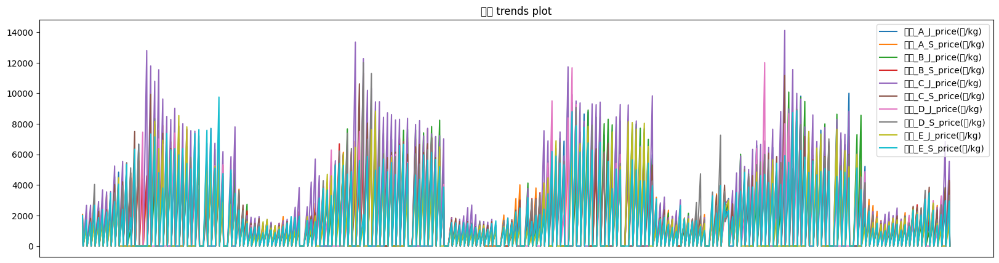

당근


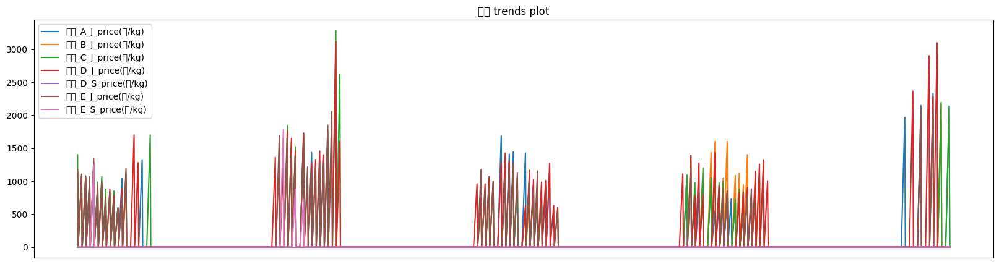

양배추


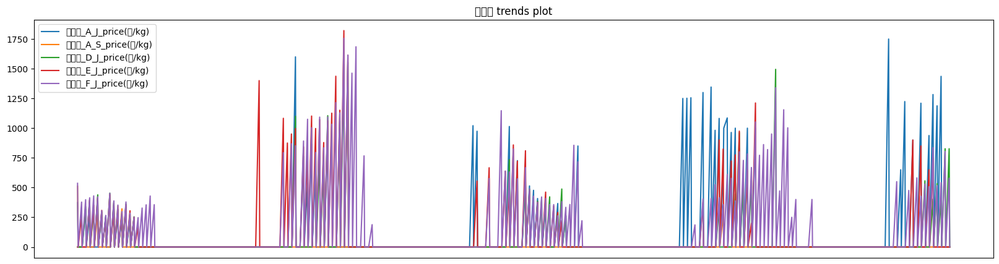

무


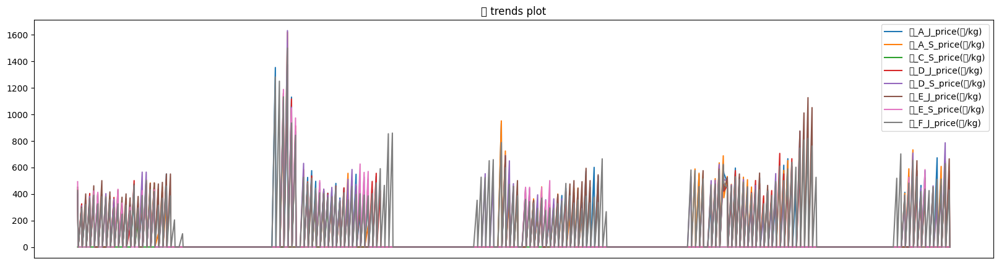

브로콜리


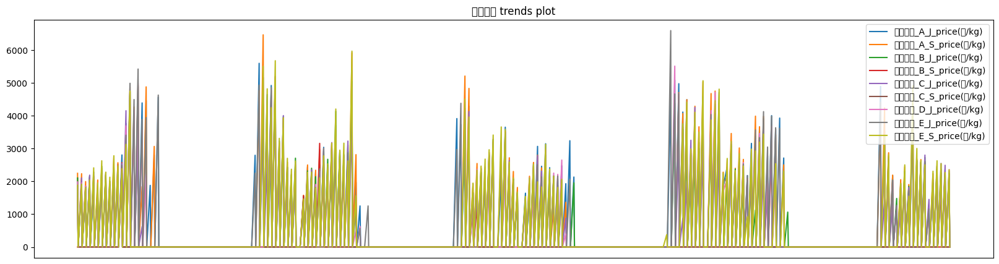

In [97]:
for idx, item_name in enumerate(list(train.item.unique())):
  print(item_name)
  trends_plot(weekend_temp, item_name, False)

계절 패턴이 뚜렷하고, 유통 품목 마다 다른 분포를 보임

같은 유통 품목임에도 유통법인 마다 다른 패턴을 보임

공휴일 또는 주말에도 유통이 일부 존재하는 것을 확인

--> 공휴일 여부에 따라 가격 차이가 있다면 평일 유통에 영향이 없을 것으로 판단

--> 만약 가격 차이가 있다면 공휴일 행을 찾아 제거

유통 품목 마다 이상치가 보임

유통 품목 별로 유통되지 않은 날들이 다른 패턴을 가지는 것을 확인할 수 있습니다.
유통되지 않은 날들을 어떻게 처리할 것인가? 에 대한 방안
- 01.01과 01.02은 무조건 유통되지 않은 날짜 임을 확인
- 데이터 보간
- 0을 그대로 유지
- 휴일 이벤트 처리 (테스트 데이터에는 휴일이 존재하지 않음, 학습 데이터에 휴일인 날짜 행을 제거)

In [ ]:
# 2019년 1월 1일 ~ 2019년 2월 1일 한달간 패턴
pivot_train.loc[(pivot_train.timestamp >= '2019-01-01') & (pivot_train.timestamp < '2019-02-01'), '양배추_F_J_price(원/kg)'].plot()

감귤


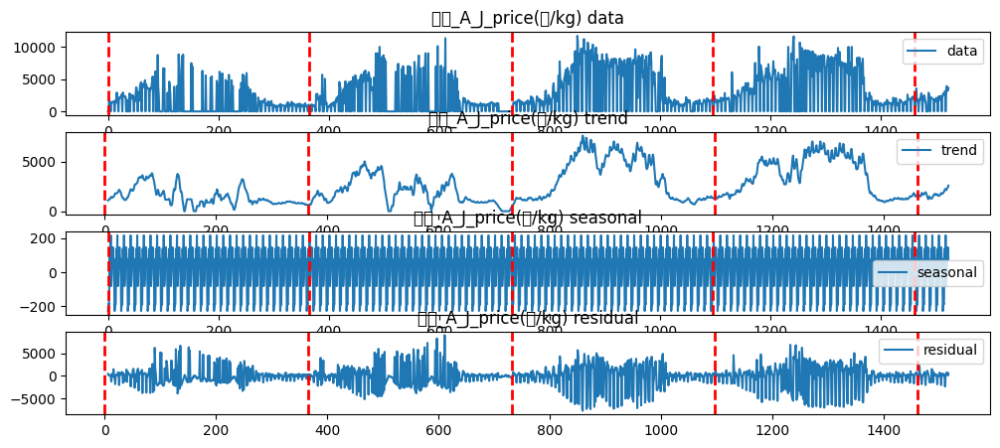

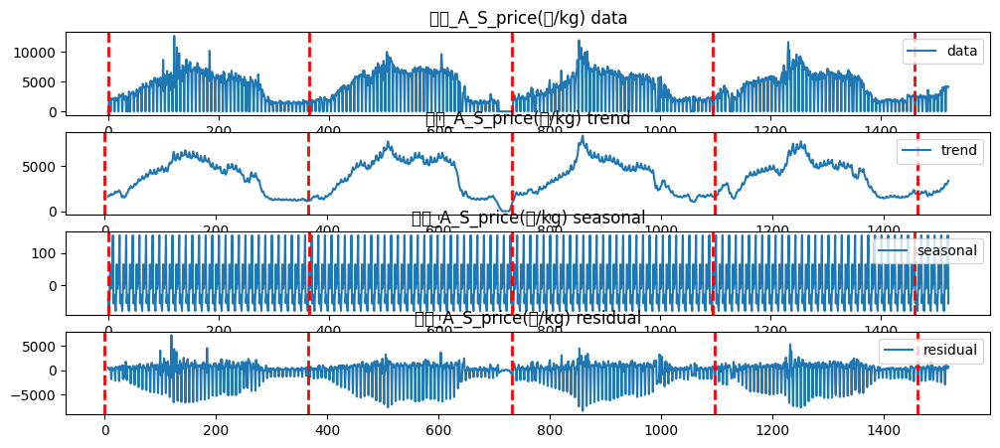

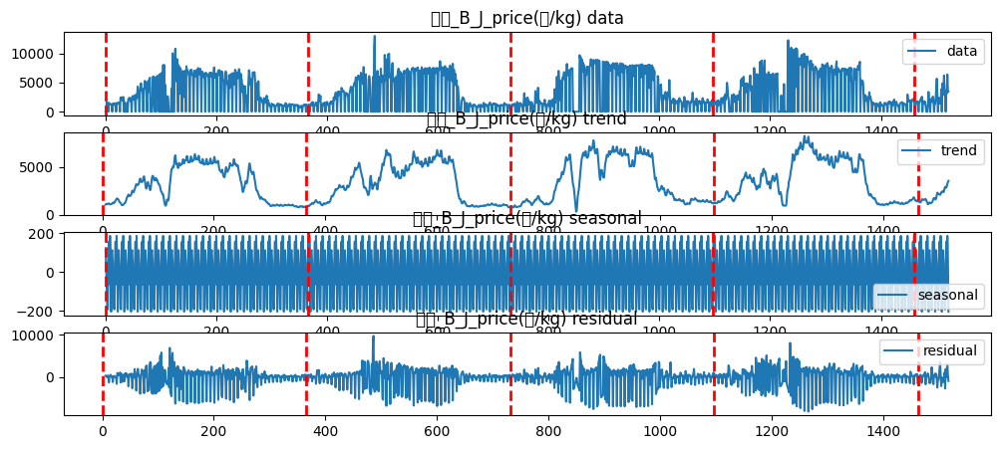

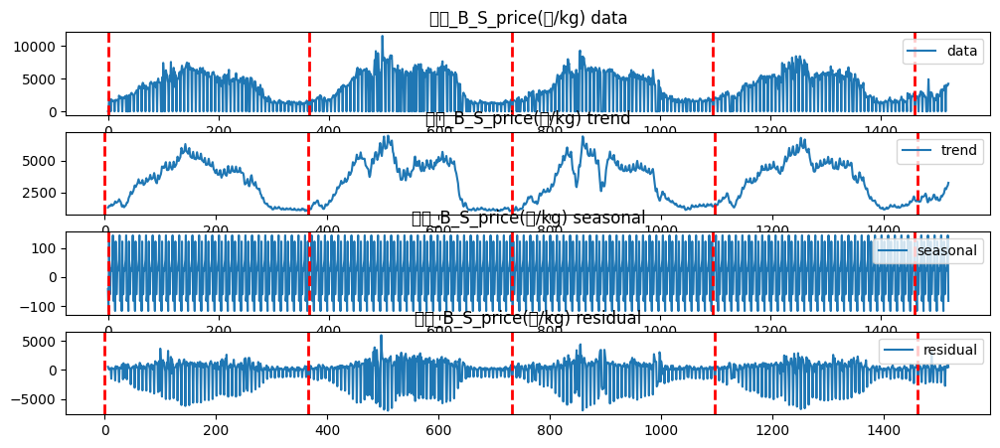

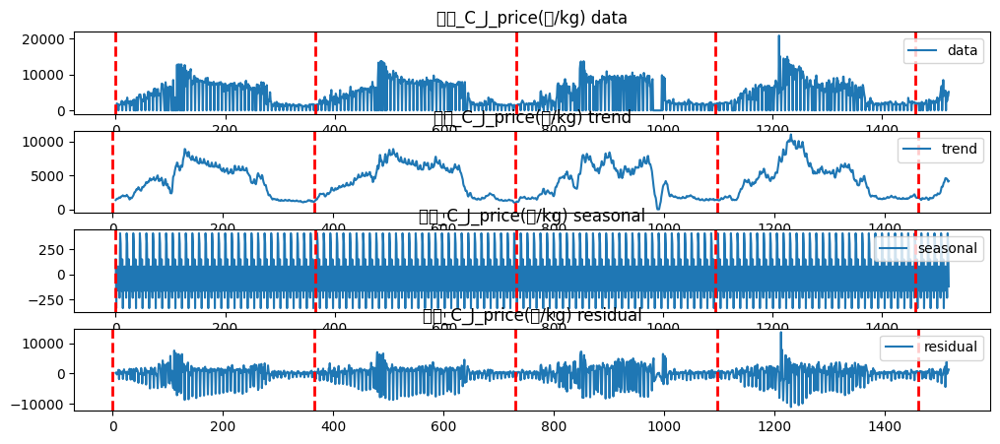

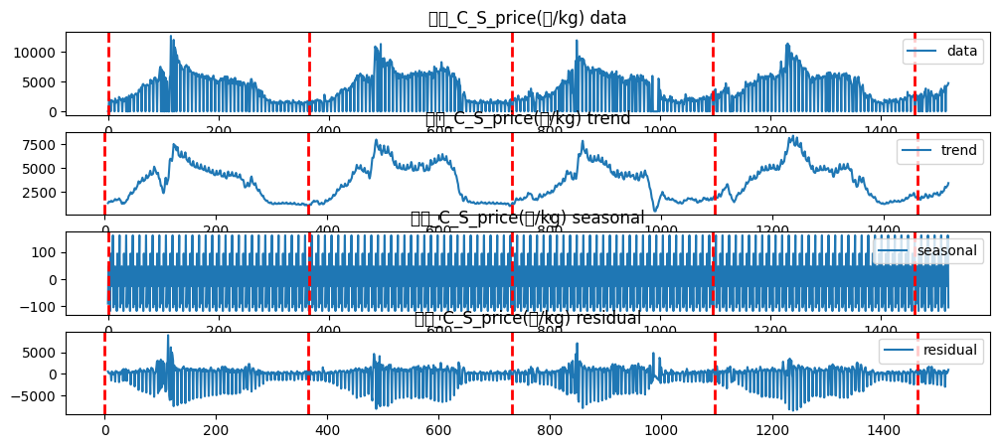

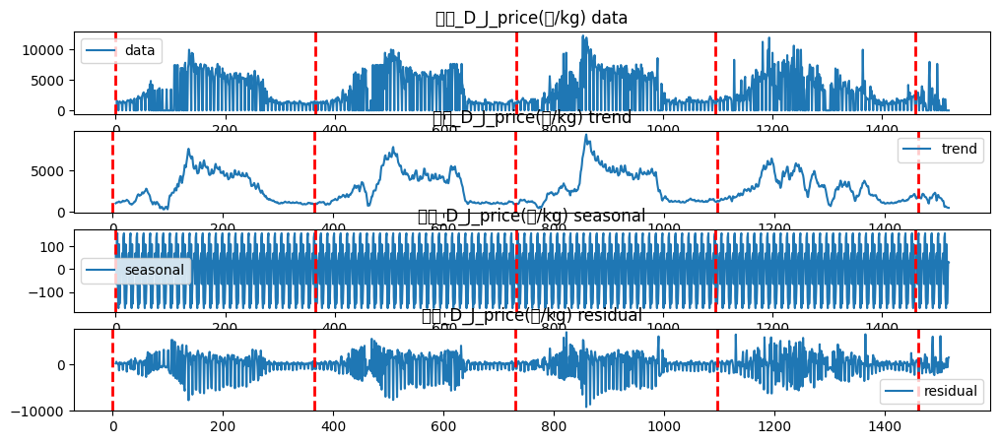

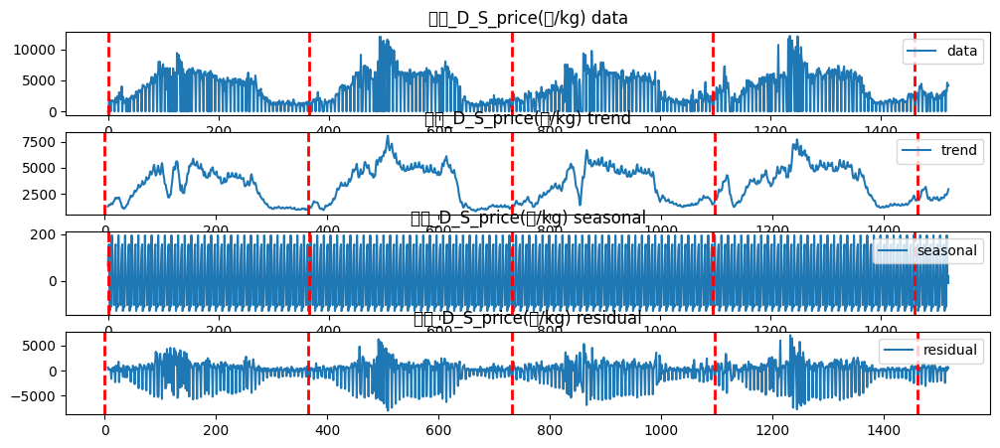

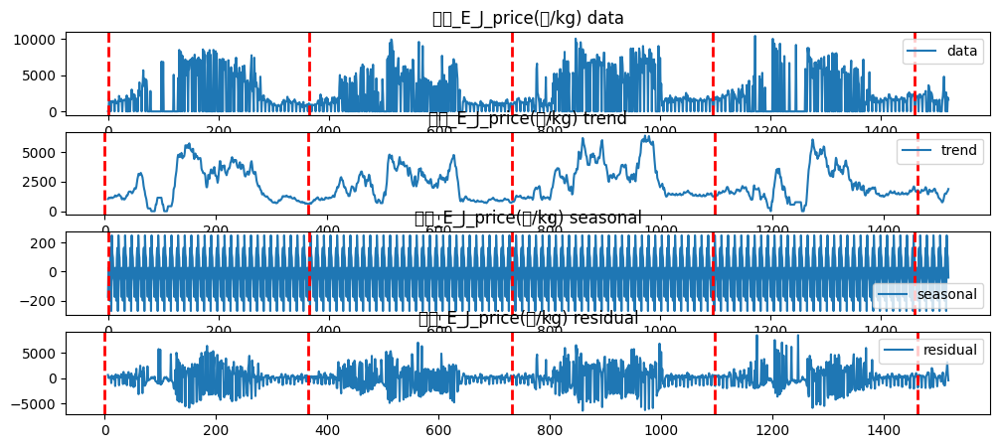

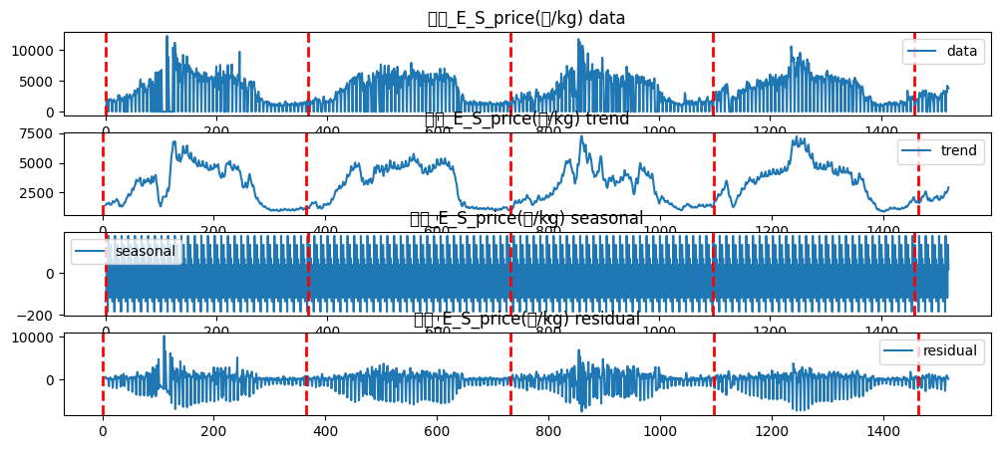

당근


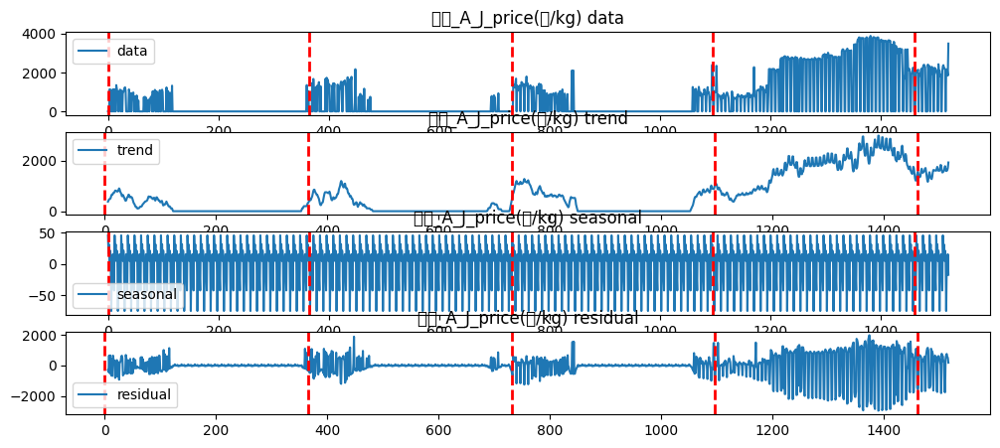

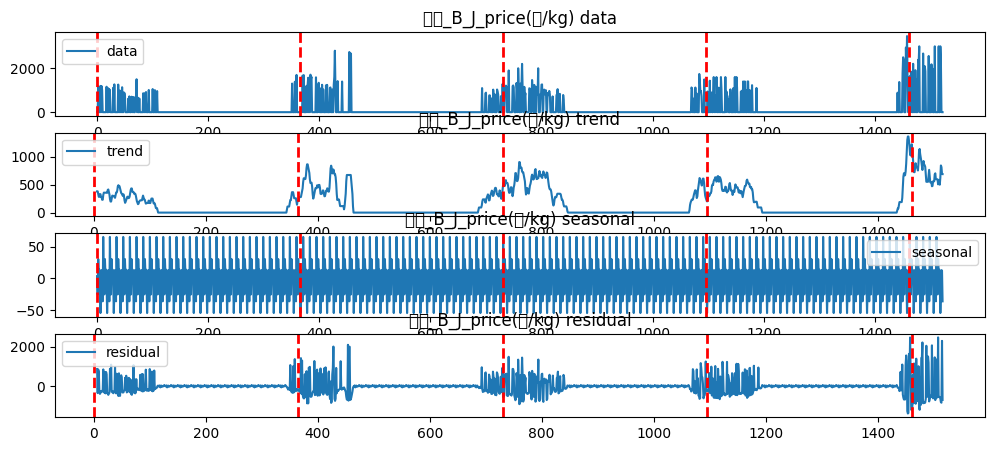

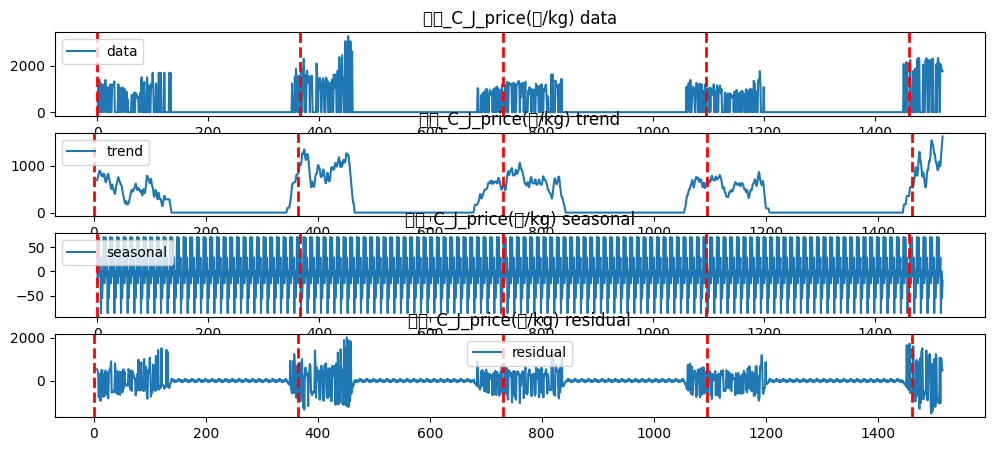

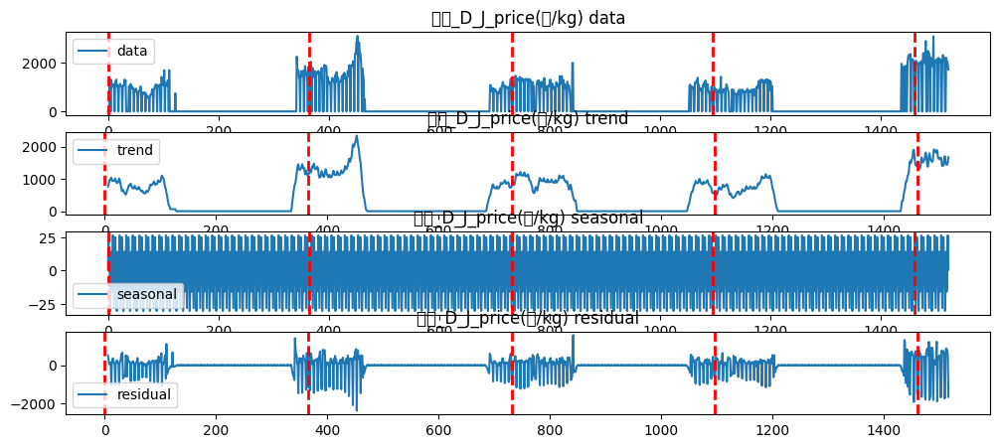

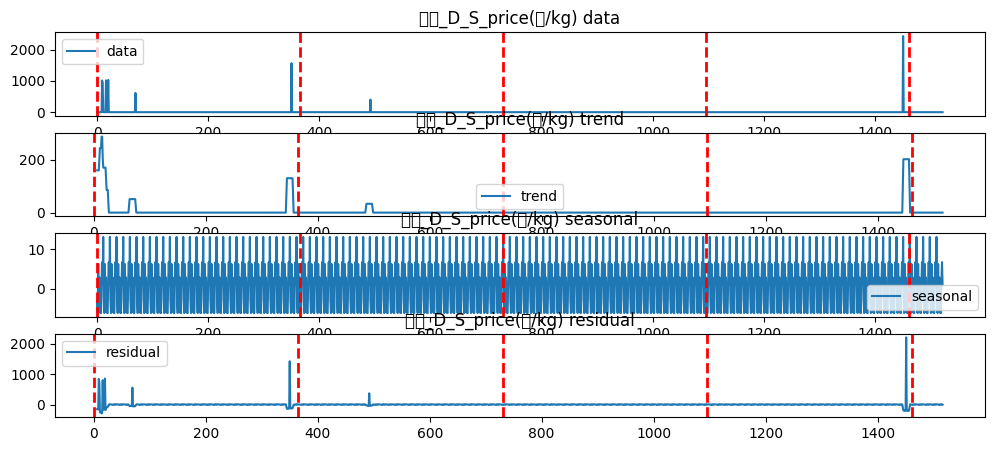

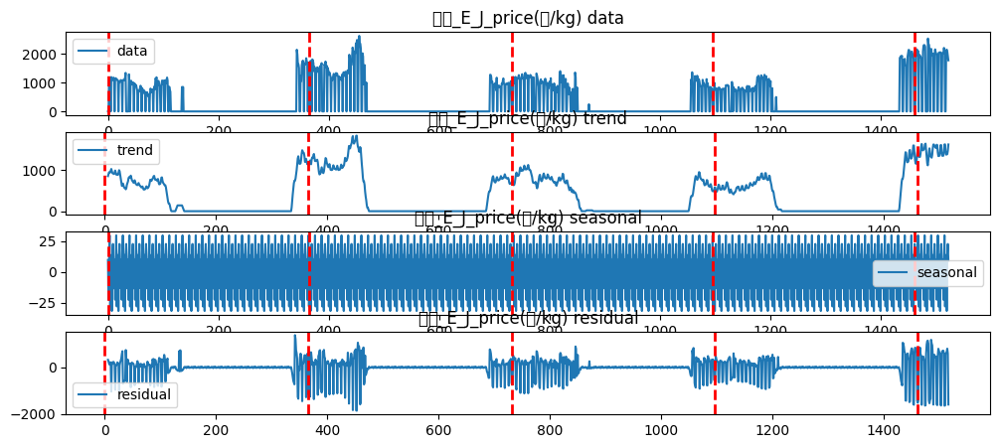

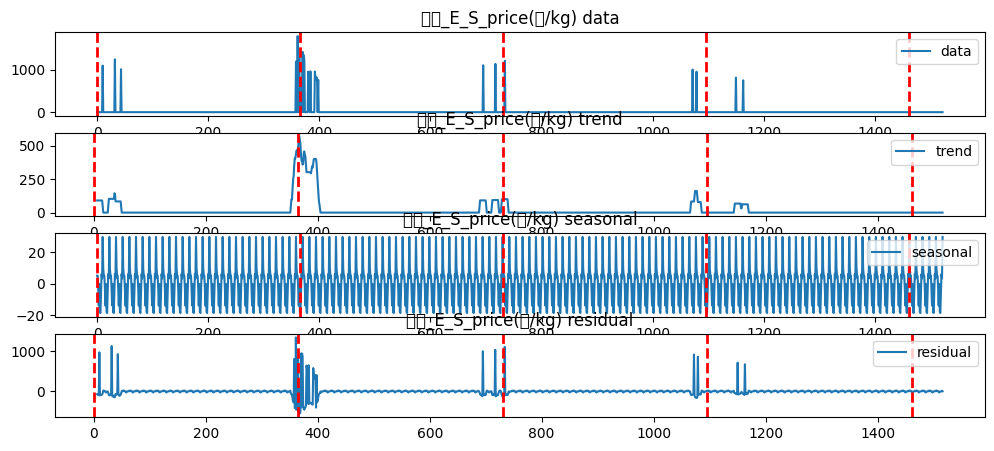

양배추


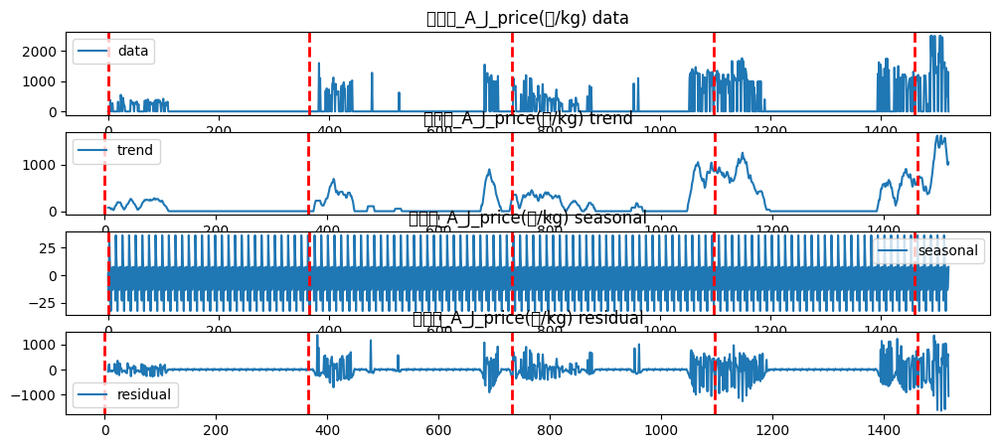

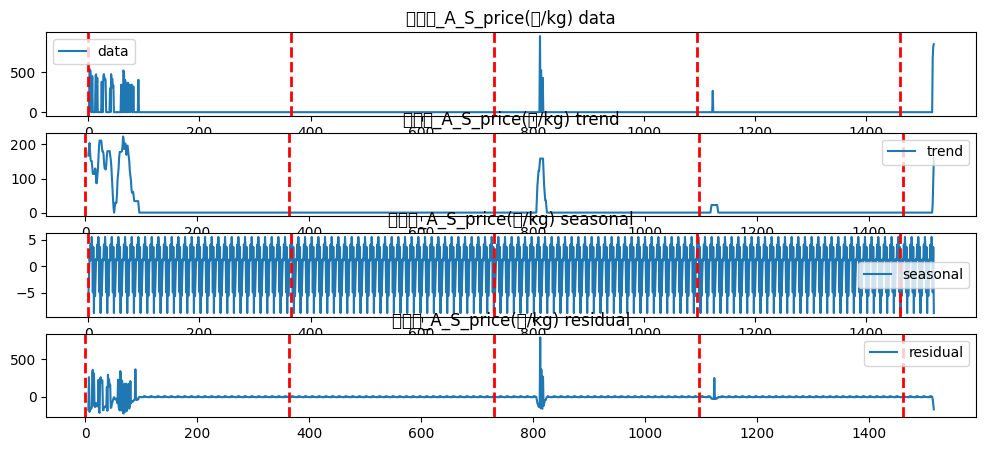

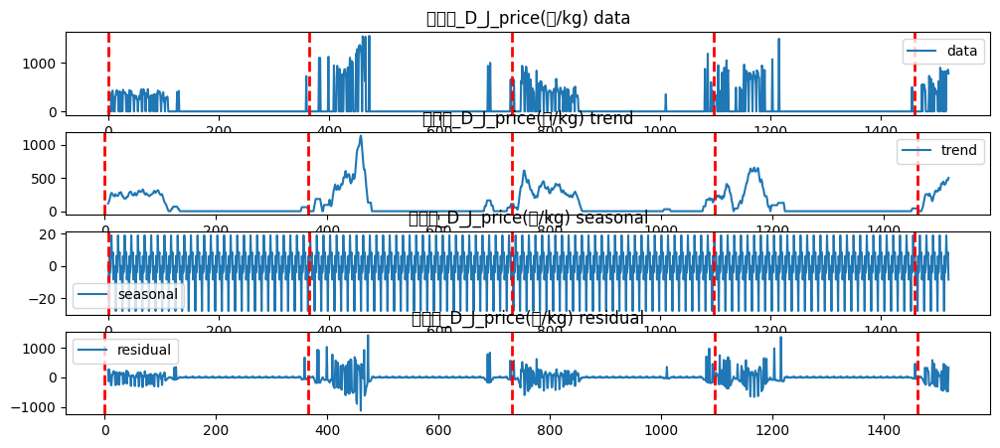

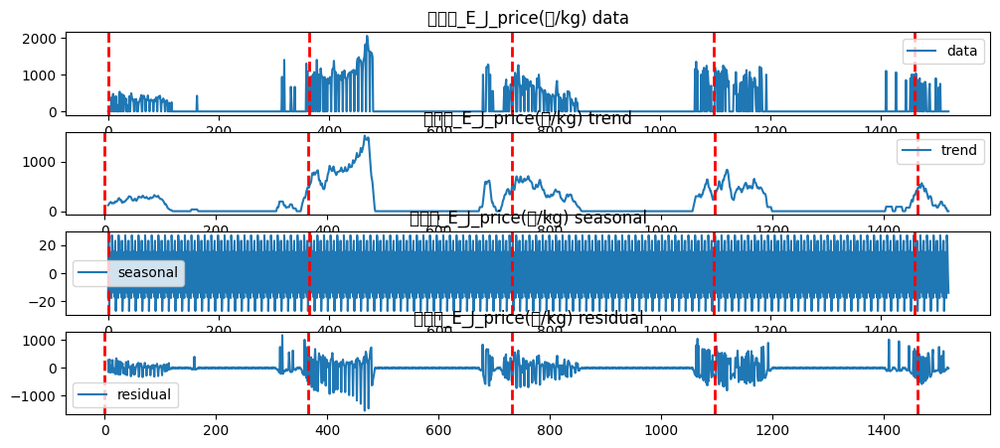

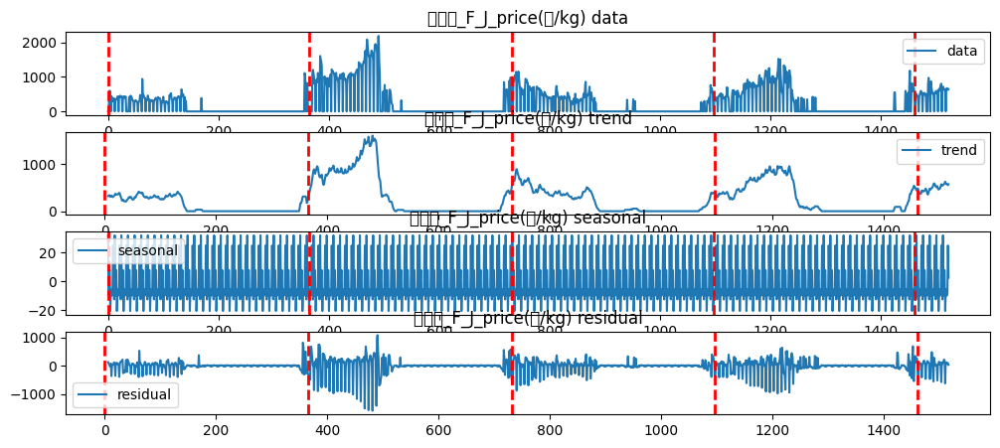

무


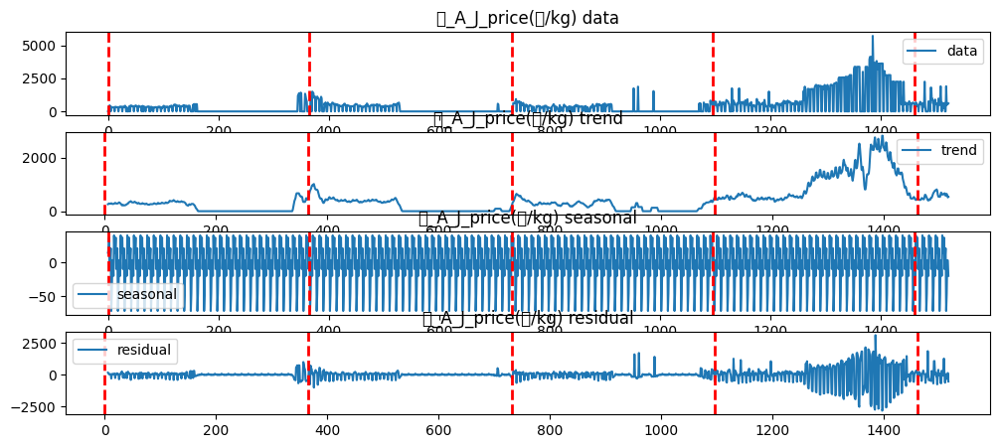

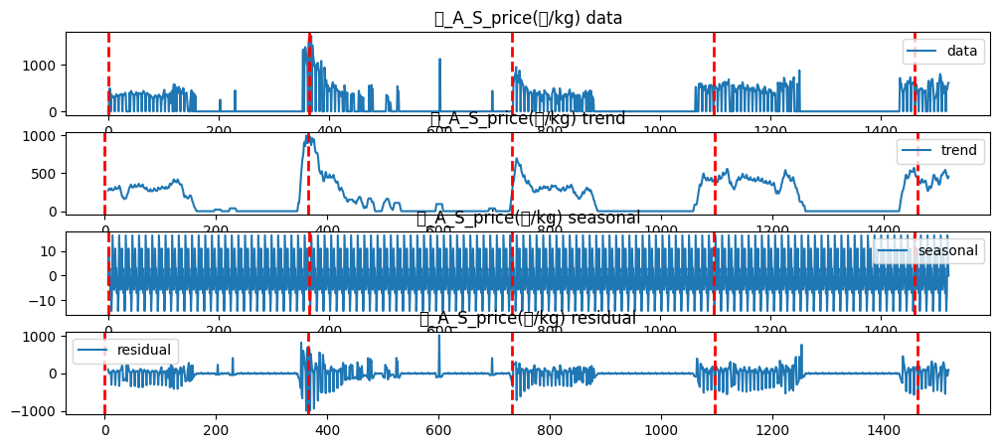

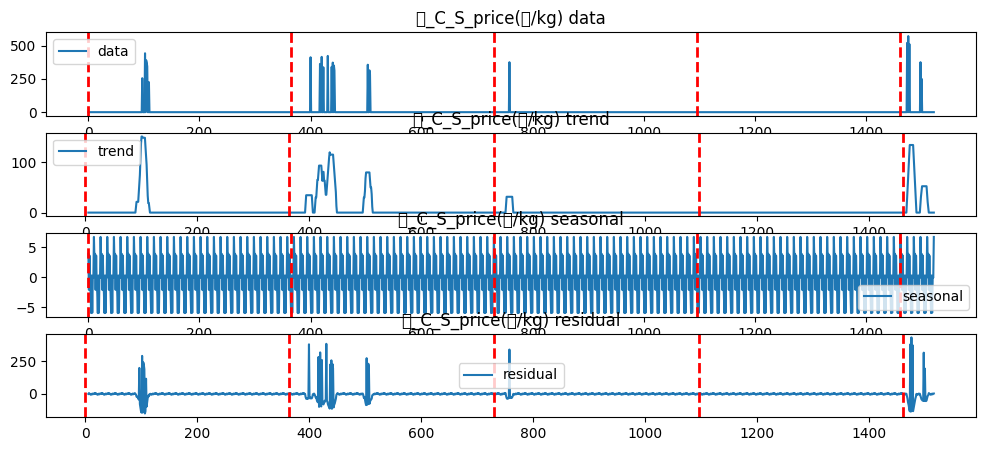

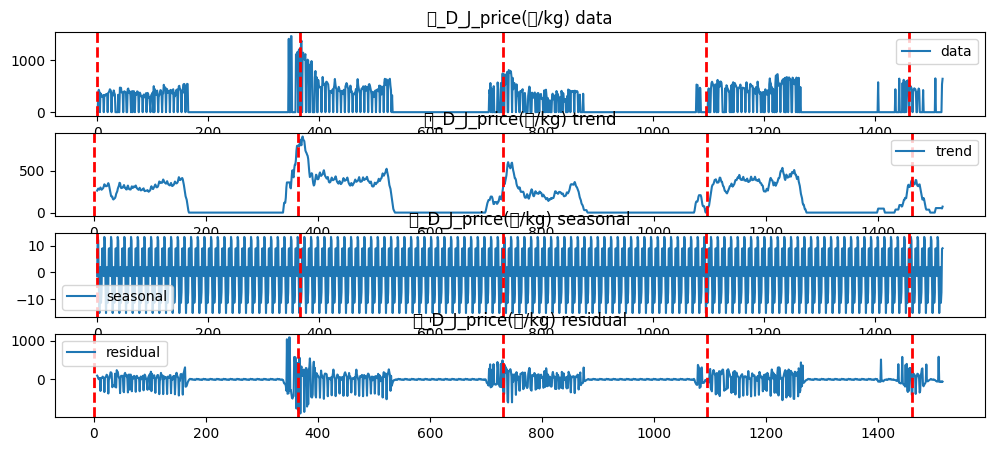

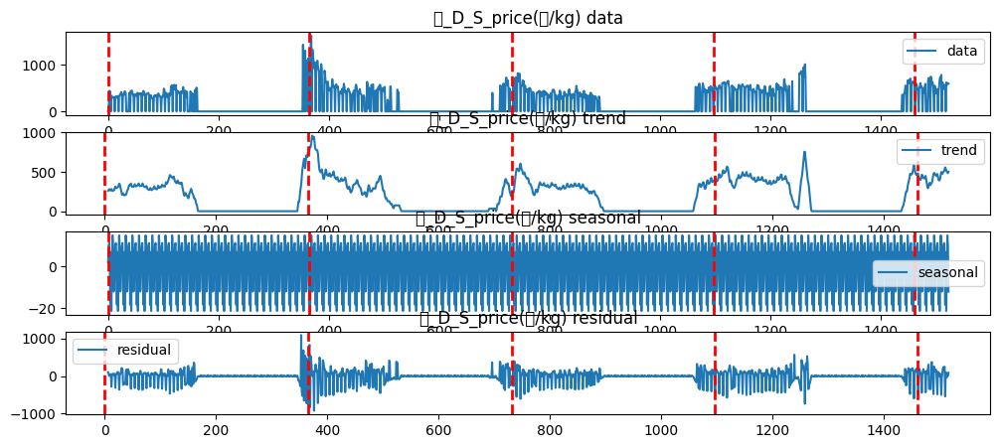

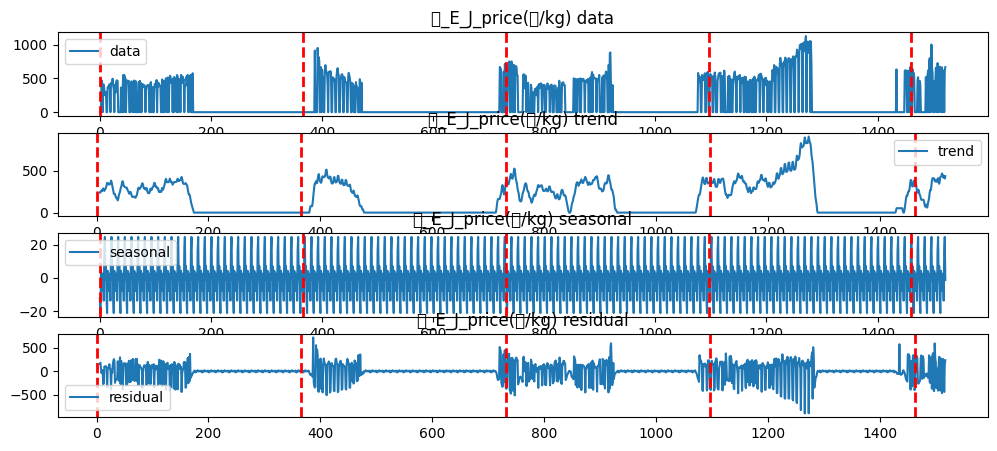

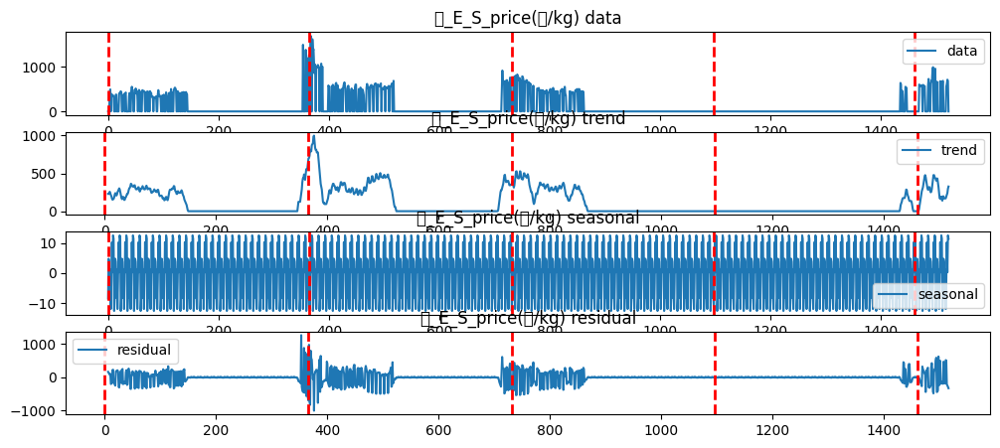

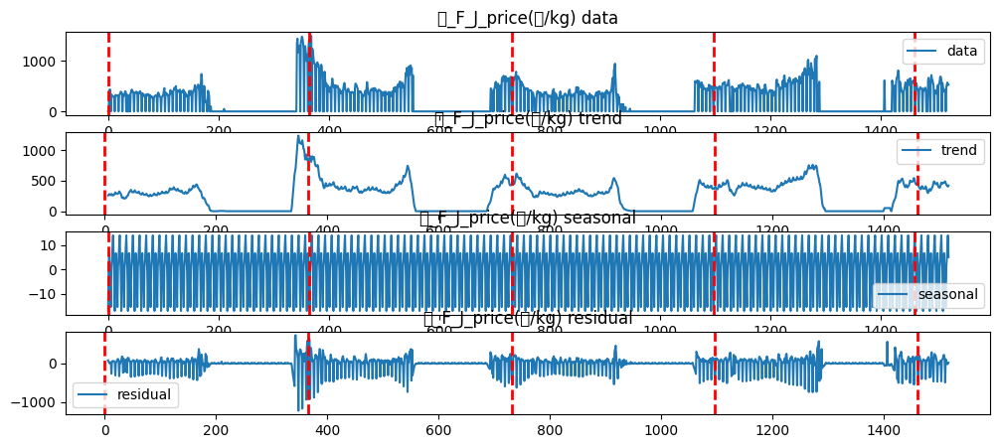

브로콜리


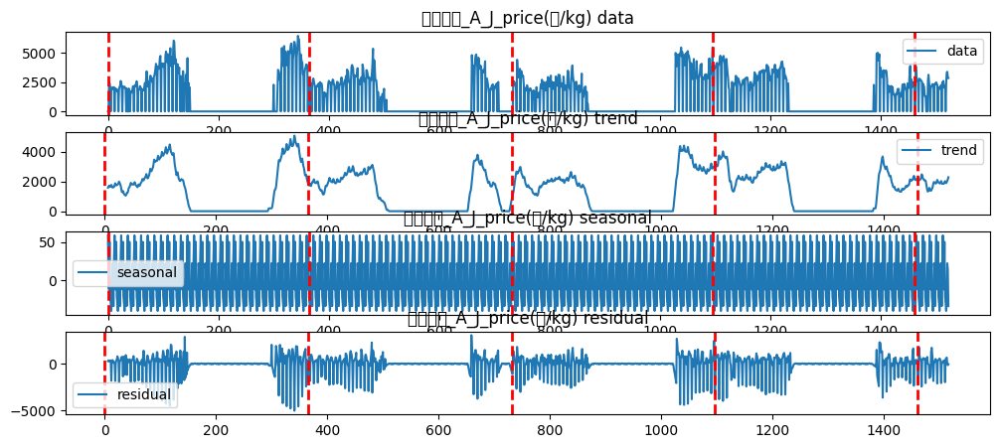

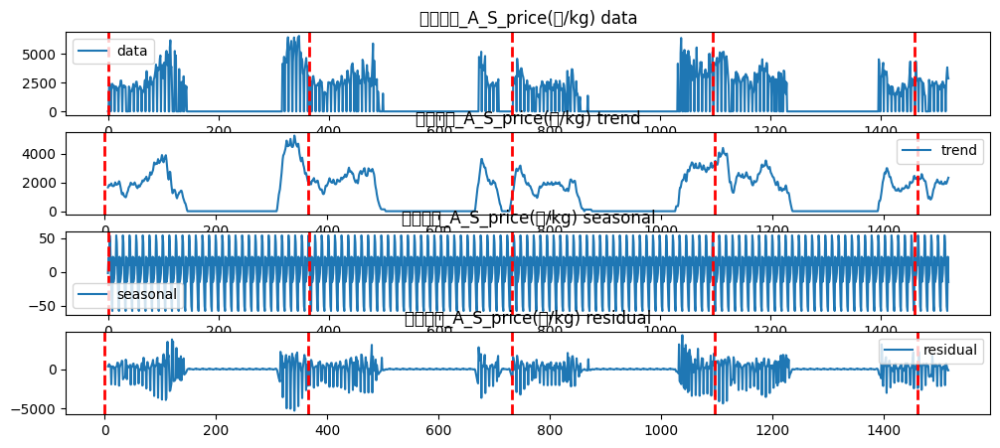

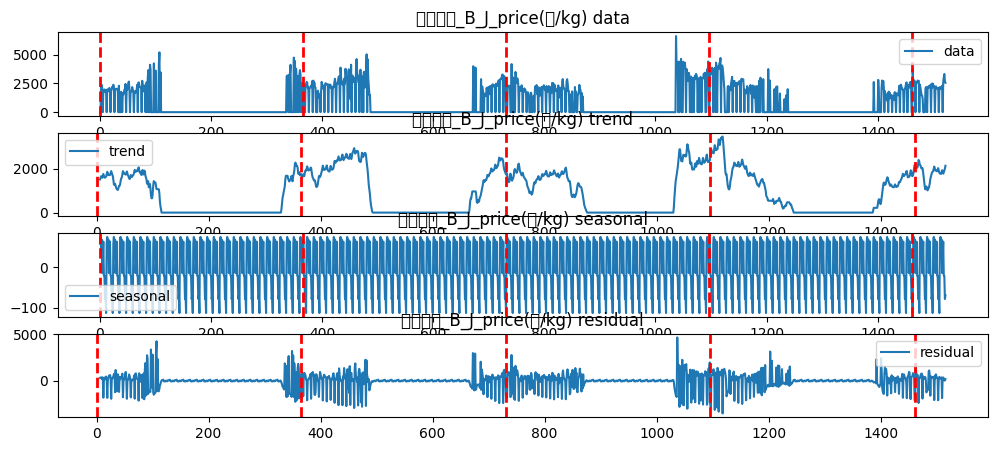

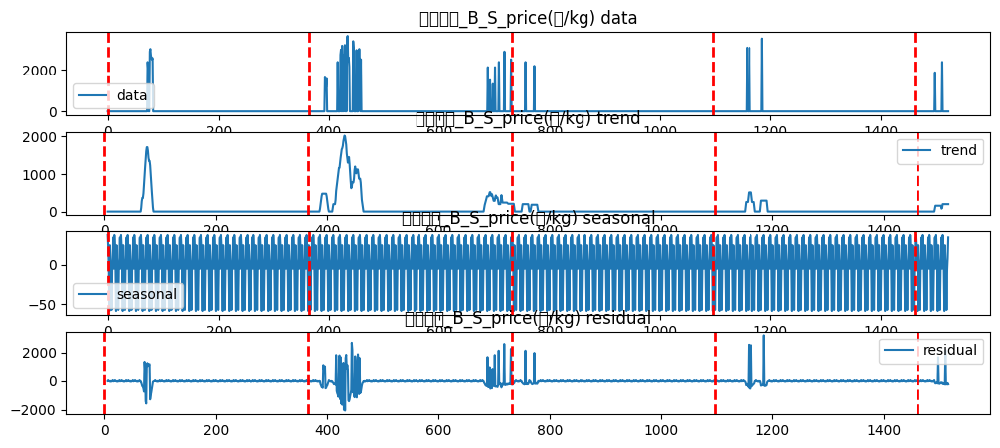

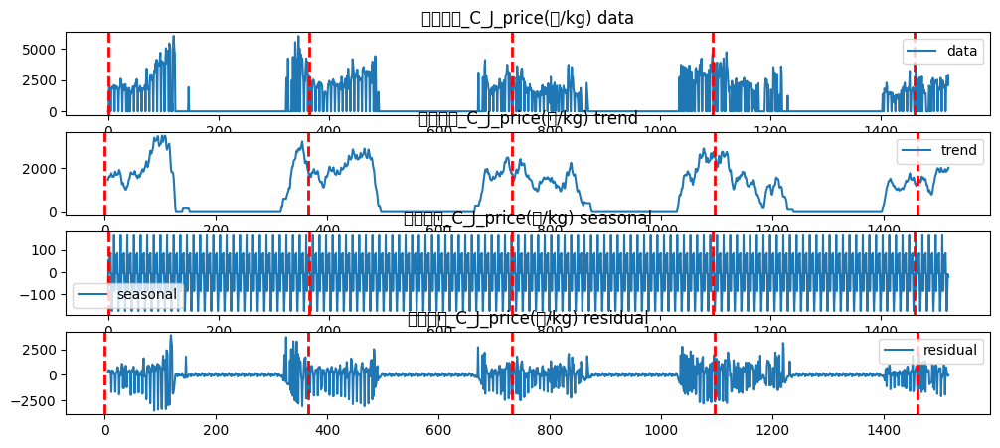

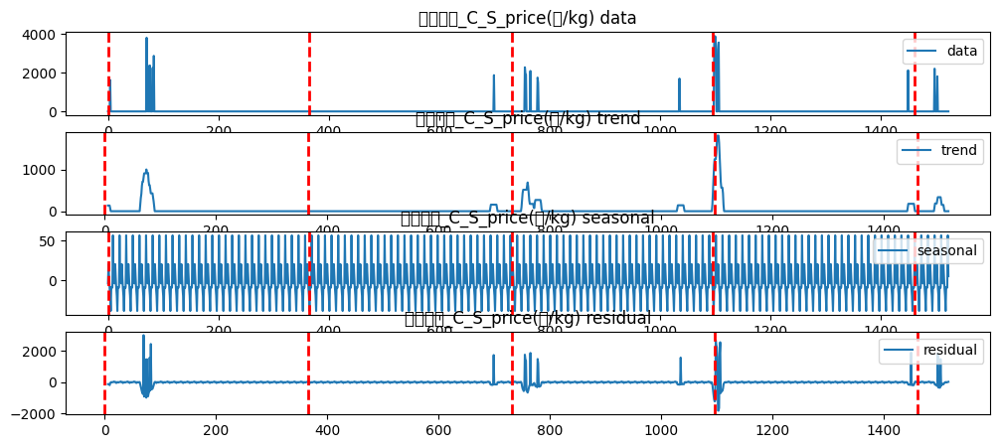

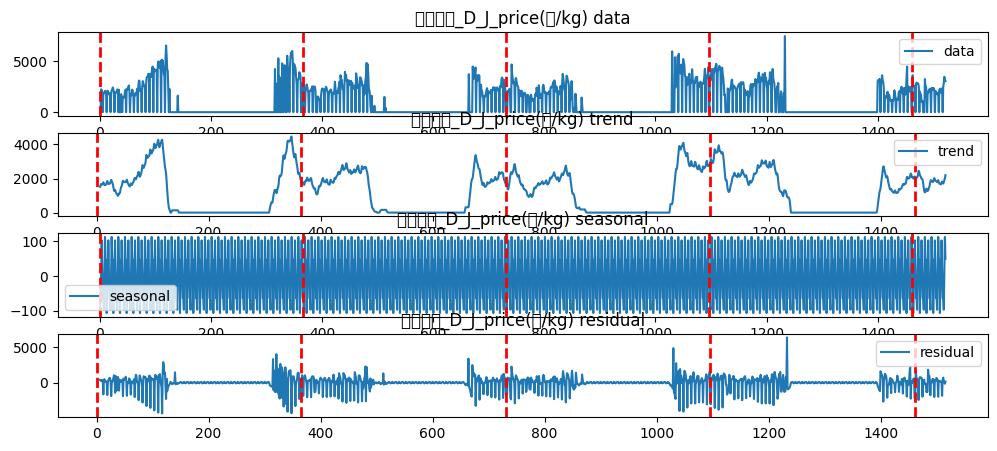

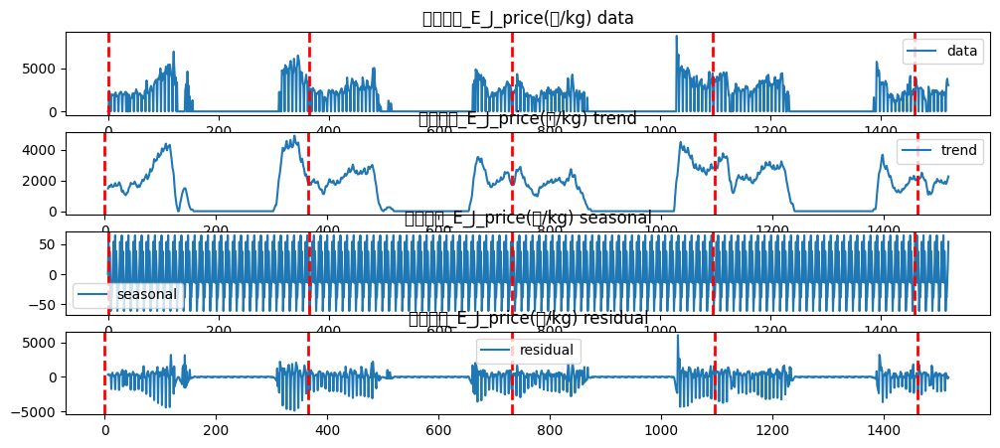

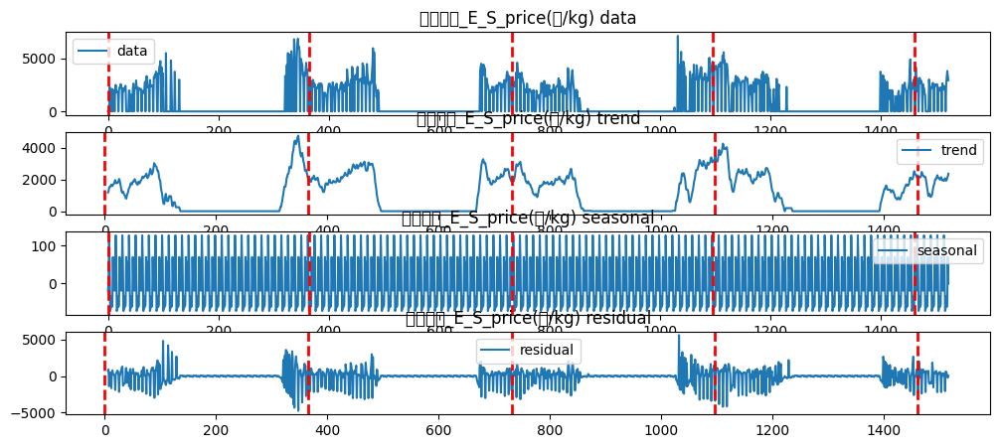

In [ ]:
for idx, item_name in enumerate(list(train.item.unique())):
  print(item_name)
  seasonal_plot(pivot_train, item_name)

In [98]:
# 유통이 없는 일 수
pivot_train[~pivot_train.isin([0.0])].isnull().sum()

timestamp                  0
감귤_A_J_price(원/kg)       511
감귤_A_S_price(원/kg)       276
감귤_B_J_price(원/kg)       348
감귤_B_S_price(원/kg)       286
감귤_C_J_price(원/kg)       318
감귤_C_S_price(원/kg)       287
감귤_D_J_price(원/kg)       407
감귤_D_S_price(원/kg)       301
감귤_E_J_price(원/kg)       526
감귤_E_S_price(원/kg)       295
당근_A_J_price(원/kg)      1003
당근_B_J_price(원/kg)      1315
당근_C_J_price(원/kg)      1185
당근_D_J_price(원/kg)      1028
당근_D_S_price(원/kg)      1515
당근_E_J_price(원/kg)      1038
당근_E_S_price(원/kg)      1495
무_A_J_price(원/kg)        782
무_A_S_price(원/kg)        973
무_C_S_price(원/kg)       1499
무_D_J_price(원/kg)        983
무_D_S_price(원/kg)        929
무_E_J_price(원/kg)       1046
무_E_S_price(원/kg)       1212
무_F_J_price(원/kg)        720
브로콜리_A_J_price(원/kg)     800
브로콜리_A_S_price(원/kg)     888
브로콜리_B_J_price(원/kg)     958
브로콜리_B_S_price(원/kg)    1476
브로콜리_C_J_price(원/kg)     955
브로콜리_C_S_price(원/kg)    1499
브로콜리_D_J_price(원/kg)     856
브로콜리_E_J_price(원/kg)     812
브로콜리_E_S_price

공휴일 정보 도메인으로는 사용가능하나 학습에선 사용 불가능

In [99]:
pivot_train.drop(['isHoliday'], axis = 1, inplace = True)
pivot_test.drop(['isHoliday'], axis = 1, inplace = True)

In [100]:
pivot_train

,timestamp,감귤_A_J_price(원/kg),감귤_A_S_price(원/kg),감귤_B_J_price(원/kg),감귤_B_S_price(원/kg),감귤_C_J_price(원/kg),감귤_C_S_price(원/kg),감귤_D_J_price(원/kg),감귤_D_S_price(원/kg),감귤_E_J_price(원/kg),...,양배추_A_S_price(원/kg),양배추_D_J_price(원/kg),양배추_E_J_price(원/kg),양배추_F_J_price(원/kg),YEAR,MONTH,DAY,DAY_OF_WEEK,WEEKDAY,WEEKEND
0,2019-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2019,1,1,1,1.0,0.0
1,2019-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2019,1,2,2,2.0,0.0
2,2019-01-03,1728.0,2526.0,1692.0,1944.0,1965.0,2078.0,1616.0,2048.0,1692.0,...,510.0,0.0,0.0,478.0,2019,1,3,3,3.0,0.0
3,2019-01-04,1408.0,2134.0,1516.0,1815.0,1794.0,2002.0,1337.0,1757.0,1475.0,...,534.0,0.0,0.0,600.0,2019,1,4,4,4.0,0.0
4,2019-01-05,1250.0,2075.0,1471.0,1717.0,1773.0,1815.0,1234.0,1719.0,1392.0,...,511.0,0.0,0.0,536.0,2019,1,5,5,5.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1518,2023-02-27,2657.0,4166.0,3540.0,4057.0,5037.0,4180.0,0.0,3409.0,2620.0,...,0.0,748.0,0.0,652.0,2023,2,27,0,0.0,0.0
1519,2023-02-28,3922.0,4009.0,3141.0,3821.0,2643.0,4234.0,0.0,3236.0,1673.0,...,0.0,809.0,0.0,672.0,2023,2,28,1,1.0,0.0
1520,2023-03-01,3397.0,4173.0,6382.0,4037.0,3742.0,4357.0,0.0,4631.0,0.0,...,680.0,798.0,0.0,621.0,2023,3,1,2,2.0,0.0
1521,2023-03-02,3195.0,4219.0,3558.0,4004.0,3983.0,4466.0,0.0,4114.0,1904.0,...,821.0,858.0,0.0,653.0,2023,3,2,3,3.0,0.0


In [101]:
pivot_train.columns[pivot_train.columns.str.contains('_A_J_')]

Index(['감귤_A_J_price(원/kg)', '당근_A_J_price(원/kg)', '무_A_J_price(원/kg)',
       '브로콜리_A_J_price(원/kg)', '양배추_A_J_price(원/kg)'],
      dtype='object')

원핫인코딩

In [102]:
# weekday_dummy = pd.get_dummies(pivot_train['WEEKDAY'])
# weekday_dummy.columns = ['WEEKDAY_' + f'{col}' for col in weekday_dummy]
# pivot_train = pd.concat([pivot_train, weekday_dummy], axis = 1)

# weekend_dummy = pd.get_dummies(pivot_train['WEEKEND'])
# weekend_dummy.columns = ['WEEKEND_' + f'{col}' for col in weekend_dummy]
# pivot_train = pd.concat([pivot_train, weekend_dummy], axis = 1)

In [103]:
# pivot_train.drop(['WEEKDAY', 'WEEKEND'], axis = 1, inplace = True)

In [104]:
temp = pivot_train.loc[pivot_train['감귤_A_J_price(원/kg)'] == 0, ['WEEKDAY_0.0',	'WEEKDAY_1.0',	'WEEKDAY_2.0',	'WEEKDAY_3.0',	'WEEKDAY_4.0',	'WEEKDAY_5.0',	'WEEKDAY_6.0']]
plt.figure(figsize = (12, 5))
for i, col in enumerate(temp.columns):
  plt.subplot(len(temp.columns), 1, i+1)
  plt.plot(temp[col])
  plt.title(col)
plt.show()

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ /usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3553 in run_code        │
│                                                                                                  │
│   3550 │   │   │   │   elif async_ :                                                             │
│   3551 │   │   │   │   │   await eval(code_obj, self.user_global_ns, self.user_ns)               │
│   3552 │   │   │   │   else:                                                                     │
│ ❱ 3553 │   │   │   │   │   exec(code_obj, self.user_global_ns, self.user_ns)                     │
│   3554 │   │   │   finally:                                                                      │
│   3555 │   │   │   │   # Reset our crash handler in place                                        │
│   3556 │   │   │   │   sys.excepthook = old_excepthook                                           │
│ in <cell line: 1>:1                                                                              │
│                                                                                                  │
│ /usr/local/lib/python3.10/dist-packages/pandas/core/indexing.py:1067 in __getitem__              │
│                                                                                                  │
│   1064 │   │   │   key = tuple(com.apply_if_callable(x, self.obj) for x in key)                  │
│   1065 │   │   │   if self._is_scalar_access(key):                                               │
│   1066 │   │   │   │   return self.obj._get_value(*key, takeable=self._takeable)                 │
│ ❱ 1067 │   │   │   return self._getitem_tuple(key)                                               │
│   1068 │   │   else:                                                                             │
│   1069 │   │   │   # we by definition only have the 0th axis                                     │
│   1070 │   │   │   axis = self.axis or 0                                                         │
│                                                                                                  │
│ /usr/local/lib/python3.10/dist-packages/pandas/core/indexing.py:1256 in _getitem_tuple           │
│                                                                                                  │
│   1253 │   │   if self._multi_take_opportunity(tup):                                             │
│   1254 │   │   │   return self._multi_take(tup)                                                  │
│   1255 │   │                                                                                     │
│ ❱ 1256 │   │   return self._getitem_tuple_same_dim(tup)                                          │
│   1257 │                                                                                         │
│   1258 │   def _get_label(self, label, axis: int):                                               │
│   1259 │   │   # GH#5567 this will fail if the label is not present in the axis.                 │
│                                                                                                  │
│ /usr/local/lib/python3.10/dist-packages/pandas/core/indexing.py:924 in _getitem_tuple_same_dim   │
│                                                                                                  │
│    921 │   │   │   if com.is_null_slice(key):                                                    │
│    922 │   │   │   │   continue                                                                  │
│    923 │   │   │                                                                                 │
│ ❱  924 │   │   │   retval = getattr(retval, self.name)._getitem_axis(key, axis=i)                │
│    925 │   │   │   # We should never have retval.ndim < self.ndim, as that should                │
│    926 │   │   │   #  be handled by the _getitem_lowerdim c

1. solution

테스트 기간이 2023년 3월 4일 부터 2023년 3월 31일 까지의 기간이므로

2019년, 2020년, 2021년, 2022년의 3월 4일 ~ 3월 31일의 평균 값으로 예측 (공휴일 부분은 처리 후)

2. solution

 해당 품목의 가격 데이터

 해당 품목 종류 포함

 해당 품목 외 다른 품목 포함

In [ ]:
def MinMaxScaling(prices):
  min_price = np.min(prices)
  max_price = np.max(prices)
  scaled_price = (prices - min_price) / (max_price - min_price)
  return scaled_price, min_price, max_price

def InverseMinMaxScaling(scaled_prices, min_price, max_price):
  inverse_price = scaled_prices * (max_price - min_price) + min_price
  return inverse_price

def ZeroMinMaxScaling(prices):
  min_price = np.min(prices[prices != 0])
  max_price = np.max(prices)
  scaled_price = (prices - min_price) / (max_price - min_price)
  return scaled_price, min_price, max_price

def ZScaling(prices):
  mean_price = np.mean(prices)
  std_price = np.std(prices)
  scaled_price = (prices - mean_price) / std_price
  return scaled_price, std_price, mean_price

def Inverse_ZScaling(scaled_prices, mean_price, std_price):
  inverse_prices = scaled_prices * std_price + mean_price
  return inverse_prices

def sliding_window(data, window_size, test_sequences_size):
  xs = []
  ys = []
  for i in range(len(data) - window_size - test_sequences_size):
    X_window = data[i: i+window_size] #.reshape(window_size, 1)
    y_window = data[i+window_size:i+window_size+test_sequences_size, -1]
    xs.append(X_window)
    ys.append(y_window)

  xs = np.array(xs, dtype='float32')
  ys = np.array(ys, dtype='float32')

  return xs, ys

# def time_sliding_window(data, window_size, test_sequences_size):
#     xs = []
#     ys = []
#     for i in range(0, len(data) - window_size - test_sequences_size):
#         x = data[i:i+window_size].reshape(window_size, 1)
#         y = data[i+window_size:i+window_size+test_sequences_size]
#         xs.append(x)
#         ys.append(y)
#     return np.array(xs, dtype='float32'), np.array(ys, dtype='float32')

class CustomDataset(Dataset):
  def __init__(self, X, Y):
    self.X = X
    self.Y = Y

  def __len__(self):
    return len(self.Y)

  def __getitem__(self, idx):
    if self.Y is not None:
      return torch.Tensor(self.X[idx]), torch.Tensor(self.Y[idx])
    else:
      return torch.Tensor(self.X[idx])

def train_test_split(X, y):
  #split_index = int(len(X) - 28)
  split_index = int(len(X) * 0.9)
  print(split_index)
  X_train = X[:split_index]
  y_train = y[:split_index]
  X_val = X[split_index:]
  y_val = y[split_index:]
  return X_train, y_train, X_val, y_val

In [105]:
base_columns = ['YEAR', 'MONTH', 'DAY', 'DAY_OF_WEEK'] + list(pivot_train.columns[pivot_train.columns.str.contains('WEEKDAY')]) + list(pivot_train.columns[pivot_train.columns.str.contains('WEEKEND')])

In [106]:
def batch_train_model(model, criterion, optimizer, train_dataloader, val_dataloader, device, num_epochs=100, patience=10, verbose=True, verbose_interval=10, forcast_size = 28, min_price = 0.1, max_price = 0.1):
  model = model.to(device)

  best_model = model
  best_validation_loss = float('inf')
  best_score = float('inf')
  best_model = None
  current_patience = 0
  mean_train_history = []
  mean_val_history = []
  for epoch in range(num_epochs):
    train_history = []
    val_history = []
    model.train()
    for batch_idx, (data, target) in enumerate(train_dataloader):
      data = data.to(device)
      target = target.to(device)
      optimizer.zero_grad()
      outputs = model(data)
      loss = criterion(outputs, target)
      loss.backward()
      optimizer.step()

      train_history.append(loss.item())
    mean_train_history.append(np.mean(train_history))

    model.eval()

    with torch.no_grad():
      predictions = []
      targets = []
      for data, target in val_dataloader:
        data = data.to(device)
        target = target.to(device)
        validation_outputs = model(data)
        validation_loss = criterion(validation_outputs, target)
        predictions.append(validation_outputs)
        targets.append(target)

        val_history.append(validation_loss.item())
      mean_val_history.append(np.mean(val_history))

      y_validation = torch.cat(targets, dim=0).cpu().numpy()
      #inverse_y_validation = y_validation * std_price + mean_price
      inverse_y_validation = y_validation * (max_price - min_price) + min_price
      predicted_validation = torch.cat(predictions, dim=0).cpu().numpy()
      #inverse_predicted_validation = predicted_validation * std_price + mean_price
      inverse_predicted_validation = predicted_validation * (max_price - min_price) + min_price
      inverse_predicted_validation[inverse_predicted_validation < inverse_y_validation.min()] = 0
      validation_score = np.sqrt(mean_squared_error(inverse_y_validation, inverse_predicted_validation))

      if validation_score < best_score:
        best_model = model
        best_score = validation_score
        current_patience = 0
      else:
        current_patience += 1

      if current_patience >= patience:
        if verbose:
          print(f"Early stopping after {epoch+1} epochs without improvement.")
        break

      if verbose and (epoch + 1) % verbose_interval == 0:
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {np.mean(train_history).item():.4f}, Validation Loss: {np.mean(val_history).item():.4f}, RMSE: {validation_score:.4f}")
        plot_predictions(inverse_y_validation, inverse_predicted_validation, forcast_size)

  return best_model, mean_train_history, mean_val_history

def plot_predictions(y_validation, predicted_validation, forcast_size):
  y_validation = y_validation.reshape(-1, 28)
  predicted_validation = predicted_validation.reshape(-1, 28)

  plt.figure(figsize=(12, 5))
  plt.plot(y_validation, label="Trues", marker='o', color = 'green')
  plt.plot(predicted_validation, label="Predictions", linestyle='--', marker='o', color = 'red')
  #plt.legend()
  plt.xlabel("Time")
  plt.ylabel("Value")
  plt.show()

In [107]:
class TimeSeriesDataset(Dataset):
    def __init__(self, data, target, input_sequence_length):
        self.data = data
        self.target = target
        self.input_sequence_length = input_sequence_length

    def __len__(self):
        return len(self.data) - self.input_sequence_length

    def __getitem__(self, idx):
        data_sequence = self.data[idx:idx + self.input_sequence_length]
        target_sequence = self.target[idx + self.input_sequence_length]

        return data_sequence, target_sequence

def train_model(model, criterion, optimizer, train_dataloader, val_dataloader, device, num_epochs=100, patience=10, verbose=True, verbose_interval=10, forcast_size=28):
    model = model.to(device)

    best_model = model
    best_validation_loss = float('inf')
    best_score = float('inf')
    best_model = None
    current_patience = 0
    mean_train_history = []
    mean_val_history = []

    for epoch in range(num_epochs):
        train_history = []
        val_history = []
        model.train()

        for data, target in train_dataloader:
            data = data.to(device)
            target = target.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, target)
            loss.backward()
            optimizer.step()

            train_history.append(loss.item())
        mean_train_history.append(np.mean(train_history))

        model.eval()

        with torch.no_grad():
            val_predictions = []
            val_targets = []

            for data, target in val_dataloader:
                data = data.to(device)
                target = target.to(device)
                validation_outputs = model(data)
                validation_loss = criterion(validation_outputs, target)
                val_predictions.append(validation_outputs)
                val_targets.append(target)

                val_history.append(validation_loss.item())

            mean_val_history.append(np.mean(val_history))

            if validation_loss < best_validation_loss:
                best_model = model
                best_validation_loss = validation_loss
                current_patience = 0
            else:
                current_patience += 1

            if current_patience >= patience:
                if verbose:
                    print(f"Early stopping after {epoch+1} epochs without improvement.")
                break

            if verbose and (epoch + 1) % verbose_interval == 0:
                print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {np.mean(train_history):.4f}, Validation Loss: {np.mean(val_history):.4f}")

    return best_model, mean_train_history, mean_val_history

In [ ]:
class LSTM(nn.Module):
  def __init__(self, input_size: int = 1, hidden_size: int = 100, n_layers: int = 5, dropout: float = 0.5, output_size: int = 30, device = device):
    super(LSTM, self).__init__()
    self.input_size = input_size
    self.hidden_size = hidden_size
    self.n_layers = n_layers
    self.dropout = dropout
    self.output_size = output_size
    self.lstm = nn.LSTM(input_size, hidden_size, n_layers, batch_first = True)
    self.fc = nn.Linear(hidden_size, output_size)

  def forward(self, x):
    out, _ = self.lstm(x)
    out = self.fc(out[:, -1, :])
    return out

class BiLSTM(nn.Module):
    def __init__(self, input_size: int = 1, hidden_size: int = 100, n_layers: int = 5,
                 dropout: float = 0.5, output_size: int = 30, device=device):
      """
      Initialize a Bidirectional LSTM (BiLSTM) model.

      Args:
          input_size (int): Number of input features.
          hidden_size (int): Number of hidden units in the LSTM layers.
          n_layers (int): Number of LSTM layers.
          dropout (float): Dropout probability.
          output_size (int): Number of output units.
      """
      super(BiLSTM, self).__init__()
      self.input_size = input_size
      self.hidden_size = hidden_size
      self.n_layers = n_layers
      self.dropout = dropout
      self.output_size = output_size
      self.lstm = nn.LSTM(input_size = input_size, hidden_size = hidden_size, num_layers = n_layers, bidirectional = True, dropout = dropout, batch_first = True)
      self.fc = nn.Linear(hidden_size * 2, output_size)
      self.relu = nn.ReLU()
      self.device = device

    def forward(self, x):
      """
      Forward pass through the BiLSTM.

      Args:
          x (torch.Tensor): Input data.

      Returns:
          torch.Tensor: Output predictions.
      """
      h0 = Variable(torch.zeros(self.n_layers * 2, x.size(0), self.hidden_size)).to(device)
      c0 = Variable(torch.zeros(self.n_layers * 2, x.size(0), self.hidden_size)).to(device)
      output, (hn, cn) = self.lstm(x, (h0, c0))
      out = self.fc(output[:, -self.output_size, :])
      out = self.relu(out)
      return out

class moving_avg(torch.nn.Module):
    def __init__(self, kernel_size, stride):
        super(moving_avg, self).__init__()
        self.kernel_size = kernel_size
        self.avg = torch.nn.AvgPool1d(kernel_size=kernel_size, stride=stride, padding=0)

    def forward(self, x):
        front = x[:, 0:1, :].repeat(1, (self.kernel_size - 1) // 2, 1)
        end = x[:, -1:, :].repeat(1, (self.kernel_size - 1) // 2, 1)
        x = torch.cat([front, x, end], dim=1)
        x = self.avg(x.permute(0, 2, 1))
        x = x.permute(0, 2, 1)
        return x

class series_decomp(torch.nn.Module):
    def __init__(self, kernel_size):
        super(series_decomp, self).__init__()
        self.moving_avg = moving_avg(kernel_size, stride=1)

    def forward(self, x):
        moving_mean = self.moving_avg(x)
        residual = x - moving_mean
        return moving_mean, residual

class LTSF_DLinear(torch.nn.Module):
    def __init__(self, window_size, forcast_size, kernel_size, individual, feature_size):
        super(LTSF_DLinear, self).__init__()
        self.window_size = window_size
        self.forcast_size = forcast_size
        self.decompsition = series_decomp(kernel_size)
        self.individual = individual
        self.channels = feature_size
        if self.individual:
            self.Linear_Seasonal = torch.nn.ModuleList()
            self.Linear_Trend = torch.nn.ModuleList()
            for i in range(self.channels):
                self.Linear_Trend.append(torch.nn.Linear(self.window_size, self.forcast_size))
                #self.Linear_Trend[i].weight = torch.nn.Parameter((1/self.window_size)*torch.ones([self.forcast_size, self.window_size]))
                self.Linear_Seasonal.append(torch.nn.Linear(self.window_size, self.forcast_size))
                #self.Linear_Seasonal[i].weight = torch.nn.Parameter((1/self.window_size)*torch.ones([self.forcast_size, self.window_size]))
        else:
            self.Linear_Trend = torch.nn.Linear(self.window_size, self.forcast_size)
            #self.Linear_Trend.weight = torch.nn.Parameter((1/self.window_size)*torch.ones([self.forcast_size, self.window_size]))
            self.Linear_Seasonal = torch.nn.Linear(self.window_size,  self.forcast_size)
            #self.Linear_Seasonal.weight = torch.nn.Parameter((1/self.window_size)*torch.ones([self.forcast_size, self.window_size]))

    def forward(self, x):
        x = x[:, :, :]
        trend_init, seasonal_init = self.decompsition(x)
        trend_init, seasonal_init = trend_init.permute(0,2,1), seasonal_init.permute(0,2,1)
        if self.individual:
            trend_output = torch.zeros([trend_init.size(0), trend_init.size(1), self.forcast_size], dtype=trend_init.dtype).to(trend_init.device)
            seasonal_output = torch.zeros([seasonal_init.size(0), seasonal_init.size(1), self.forcast_size], dtype=seasonal_init.dtype).to(seasonal_init.device)
            for idx in range(self.channels):
                trend_output[:, idx, :] = self.Linear_Trend[idx](trend_init[:, idx, :])
                seasonal_output[:, idx, :] = self.Linear_Seasonal[idx](seasonal_init[:, idx, :])
        else:
            trend_output = self.Linear_Trend(trend_init)
            seasonal_output = self.Linear_Seasonal(seasonal_init)
        x = seasonal_output + trend_output
        x = x.permute(0,2,1) # [batch_size, forcast_size, channels]
        x = x[:, :, -1].squeeze(1)
        return x

class LTSF_NLinear(torch.nn.Module):
    def __init__(self, window_size, forcast_size, individual, feature_size):
        super(LTSF_NLinear, self).__init__()
        self.window_size = window_size
        self.forcast_size = forcast_size
        self.individual = individual
        self.channels = feature_size
        if self.individual:
            self.Linear = torch.nn.ModuleList()
            for i in range(self.channels):
                self.Linear.append(torch.nn.Linear(self.window_size, self.forcast_size))
        else:
            self.Linear = torch.nn.Linear(self.window_size, self.forcast_size)

    def forward(self, x):
        x = x[:, :, :]
        seq_last = x[:,-1:,:].detach()
        x = x - seq_last
        if self.individual:
            output = torch.zeros([x.size(0), self.forcast_size, x.size(2)],dtype=x.dtype).to(x.device)
            for i in range(self.channels):
                output[:,:,i] = self.Linear[i](x[:,:,i])
            x = output
        else:
            x = self.Linear(x.permute(0,2,1)).permute(0,2,1)
        x = x + seq_last
        x = x[:, :, -1].squeeze(1)
        return x

In [ ]:
class RMSELoss(torch.nn.Module):
  def __init__(self):
    super(RMSELoss,self).__init__()

  def forward(self, x, y):
    criterion = nn.MSELoss()
    loss = torch.sqrt(criterion(x, y))
    return loss

In [ ]:
# col.split('_')[:3]

In [ ]:
pivot_train

,timestamp,감귤_A_J_price(원/kg),감귤_A_S_price(원/kg),감귤_B_J_price(원/kg),감귤_B_S_price(원/kg),감귤_C_J_price(원/kg),감귤_C_S_price(원/kg),감귤_D_J_price(원/kg),감귤_D_S_price(원/kg),감귤_E_J_price(원/kg),...,양배추_A_S_price(원/kg),양배추_D_J_price(원/kg),양배추_E_J_price(원/kg),양배추_F_J_price(원/kg),YEAR,MONTH,DAY,DAY_OF_WEEK,WEEKDAY,WEEKEND
0,2019-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2019,1,1,1,1.0,0.0
1,2019-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2019,1,2,2,2.0,0.0
2,2019-01-03,1728.0,2526.0,1692.0,1944.0,1965.0,2078.0,1616.0,2048.0,1692.0,...,510.0,0.0,0.0,478.0,2019,1,3,3,3.0,0.0
3,2019-01-04,1408.0,2134.0,1516.0,1815.0,1794.0,2002.0,1337.0,1757.0,1475.0,...,534.0,0.0,0.0,600.0,2019,1,4,4,4.0,0.0
4,2019-01-05,1250.0,2075.0,1471.0,1717.0,1773.0,1815.0,1234.0,1719.0,1392.0,...,511.0,0.0,0.0,536.0,2019,1,5,5,5.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1518,2023-02-27,2657.0,4166.0,3540.0,4057.0,5037.0,4180.0,0.0,3409.0,2620.0,...,0.0,748.0,0.0,652.0,2023,2,27,0,0.0,0.0
1519,2023-02-28,3922.0,4009.0,3141.0,3821.0,2643.0,4234.0,0.0,3236.0,1673.0,...,0.0,809.0,0.0,672.0,2023,2,28,1,1.0,0.0
1520,2023-03-01,3397.0,4173.0,6382.0,4037.0,3742.0,4357.0,0.0,4631.0,0.0,...,680.0,798.0,0.0,621.0,2023,3,1,2,2.0,0.0
1521,2023-03-02,3195.0,4219.0,3558.0,4004.0,3983.0,4466.0,0.0,4114.0,1904.0,...,821.0,858.0,0.0,653.0,2023,3,2,3,3.0,0.0


In [ ]:
pivot_train['timestamp'] = pd.to_datetime(pivot_train['timestamp'])

In [ ]:
pivot_train = pivot_train.set_index('timestamp')

In [ ]:
pivot_train.columns[:-6]

Index(['감귤_A_J_price(원/kg)', '감귤_A_S_price(원/kg)', '감귤_B_J_price(원/kg)',
       '감귤_B_S_price(원/kg)', '감귤_C_J_price(원/kg)', '감귤_C_S_price(원/kg)',
       '감귤_D_J_price(원/kg)', '감귤_D_S_price(원/kg)', '감귤_E_J_price(원/kg)',
       '감귤_E_S_price(원/kg)', '당근_A_J_price(원/kg)', '당근_B_J_price(원/kg)',
       '당근_C_J_price(원/kg)', '당근_D_J_price(원/kg)', '당근_D_S_price(원/kg)',
       '당근_E_J_price(원/kg)', '당근_E_S_price(원/kg)', '무_A_J_price(원/kg)',
       '무_A_S_price(원/kg)', '무_C_S_price(원/kg)', '무_D_J_price(원/kg)',
       '무_D_S_price(원/kg)', '무_E_J_price(원/kg)', '무_E_S_price(원/kg)',
       '무_F_J_price(원/kg)', '브로콜리_A_J_price(원/kg)', '브로콜리_A_S_price(원/kg)',
       '브로콜리_B_J_price(원/kg)', '브로콜리_B_S_price(원/kg)', '브로콜리_C_J_price(원/kg)',
       '브로콜리_C_S_price(원/kg)', '브로콜리_D_J_price(원/kg)', '브로콜리_E_J_price(원/kg)',
       '브로콜리_E_S_price(원/kg)', '양배추_A_J_price(원/kg)', '양배추_A_S_price(원/kg)',
       '양배추_D_J_price(원/kg)', '양배추_E_J_price(원/kg)', '양배추_F_J_price(원/kg)'],
      dtype='object')

(1523, 7)
511
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


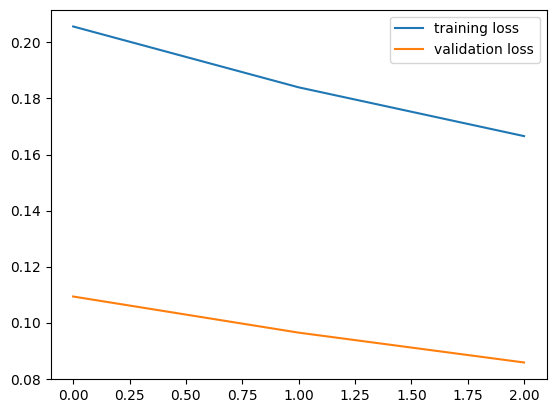

forcasting


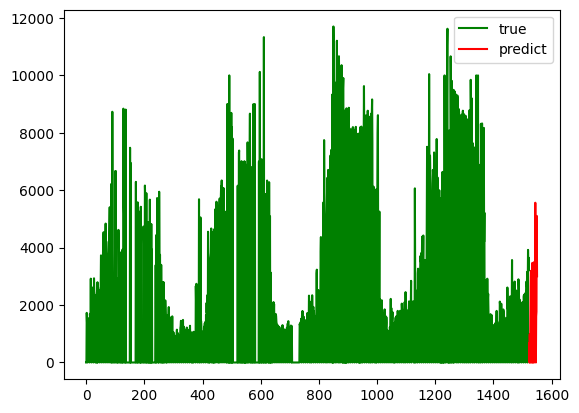

(1523, 7)
276
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


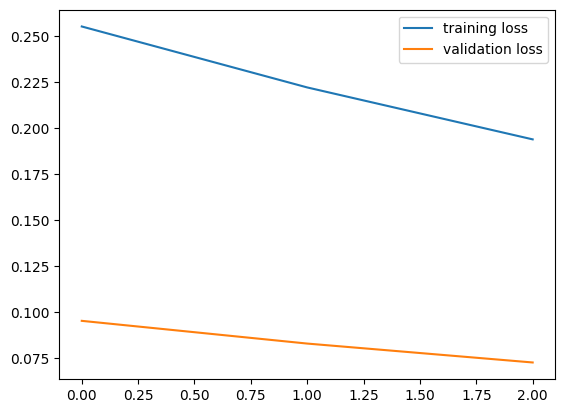

forcasting


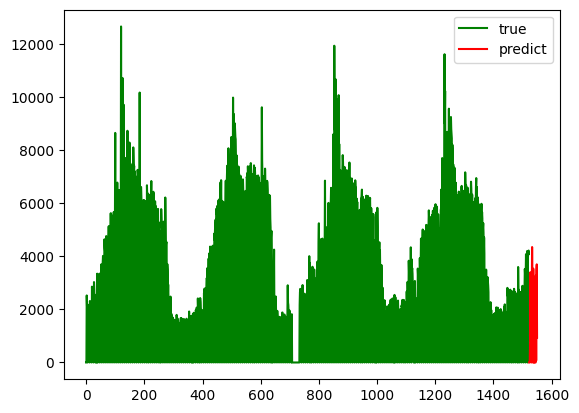

(1523, 7)
348
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


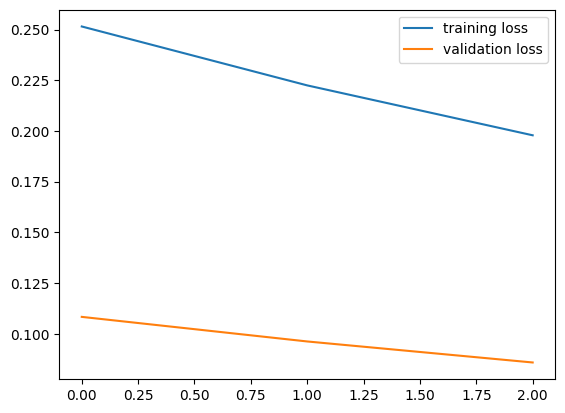

forcasting


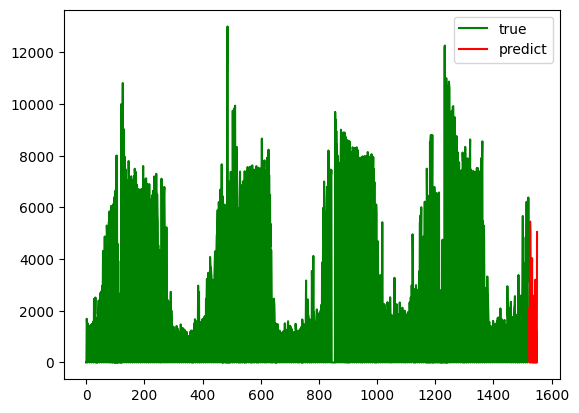

(1523, 7)
286
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


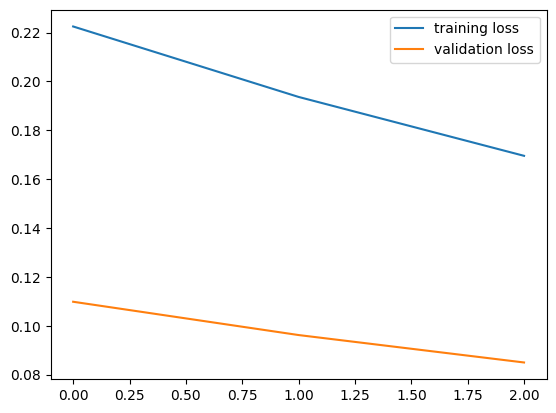

forcasting


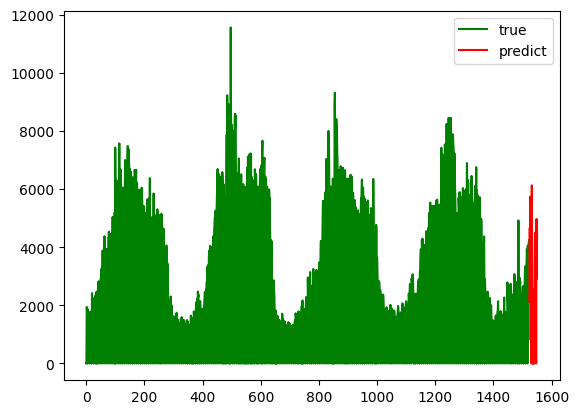

(1523, 7)
318
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


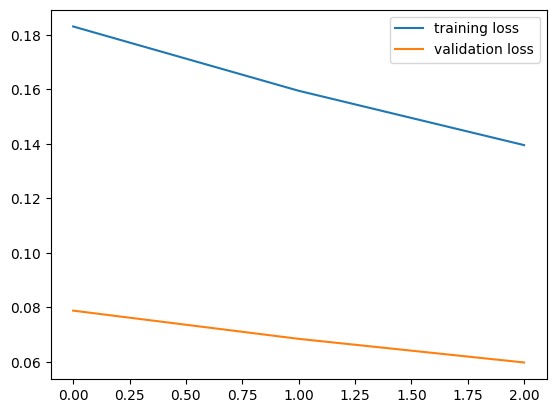

forcasting


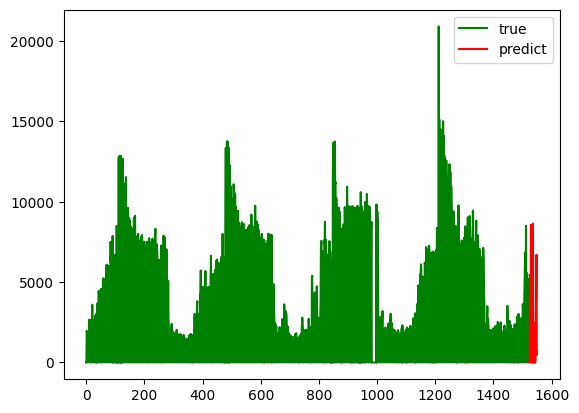

(1523, 7)
287
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


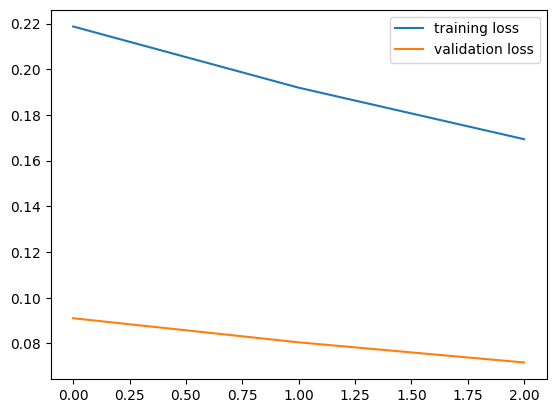

forcasting


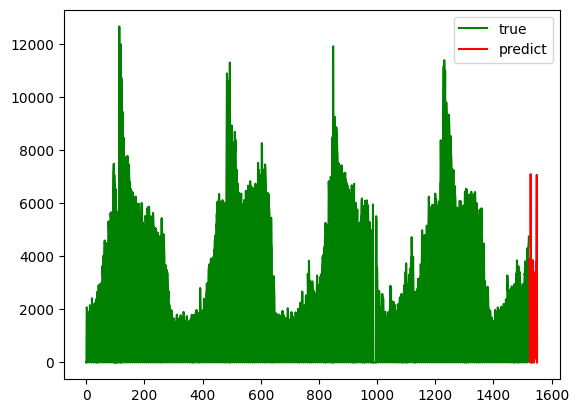

(1523, 7)
407
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


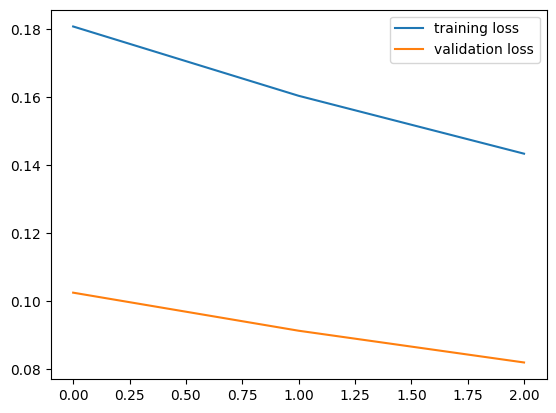

forcasting


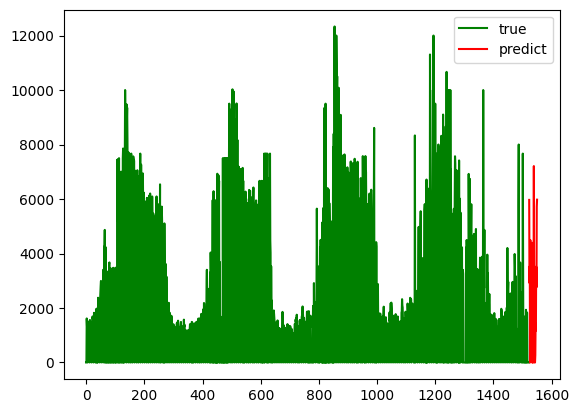

(1523, 7)
301
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


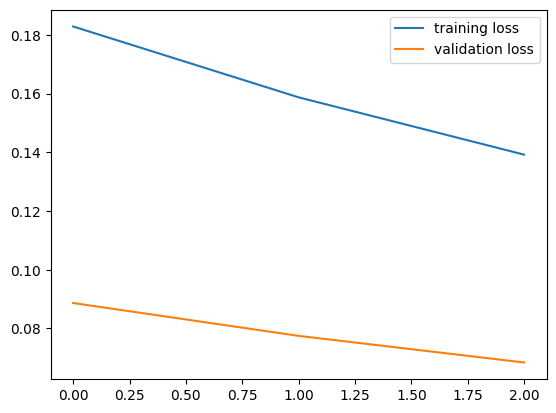

forcasting


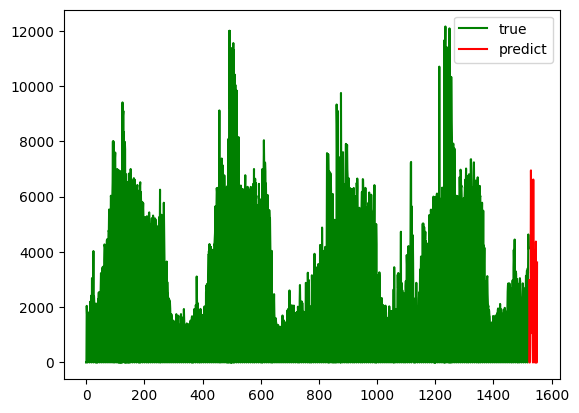

(1523, 7)
526
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


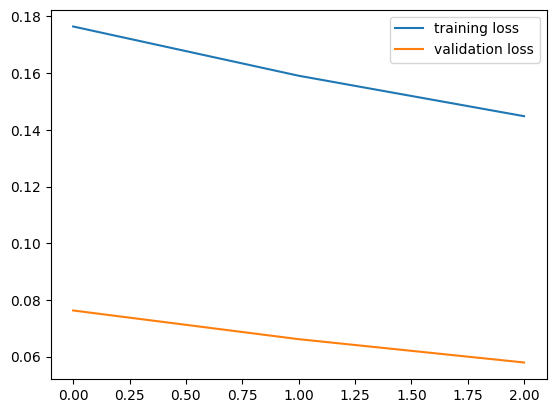

forcasting


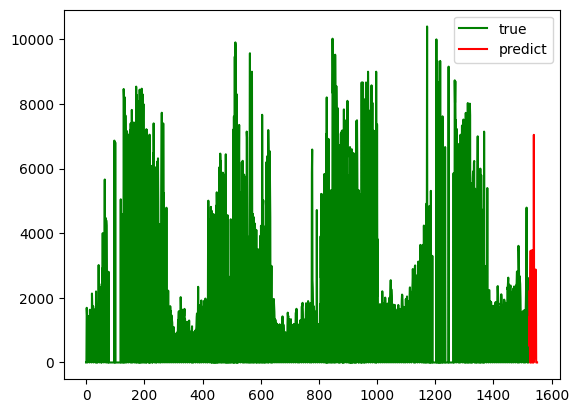

(1523, 7)
295
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


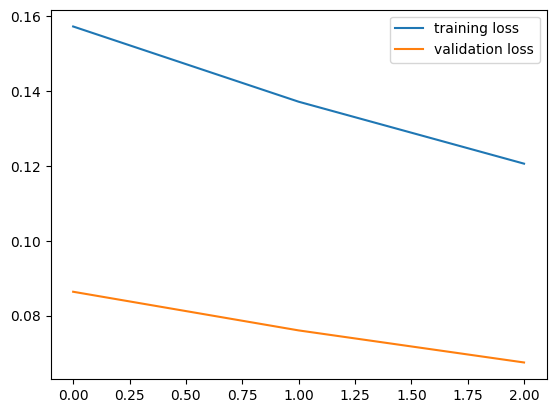

forcasting


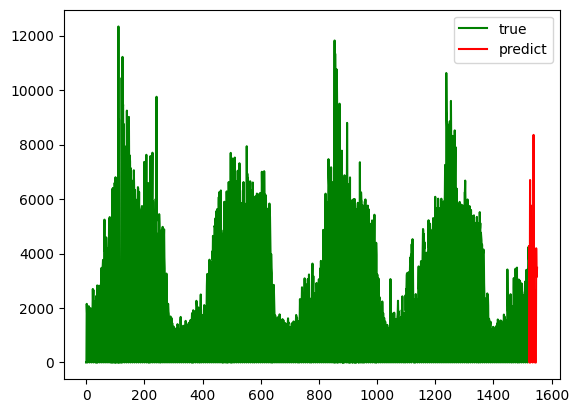

(1523, 7)
1003
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


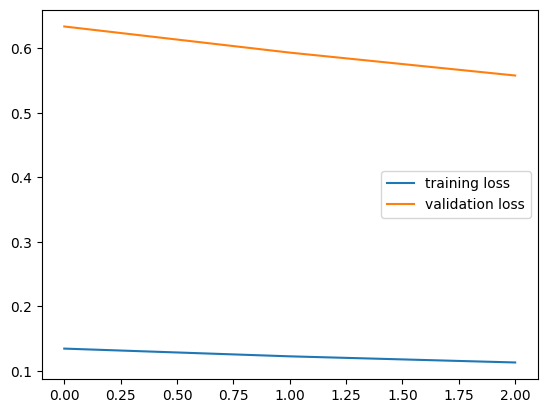

forcasting


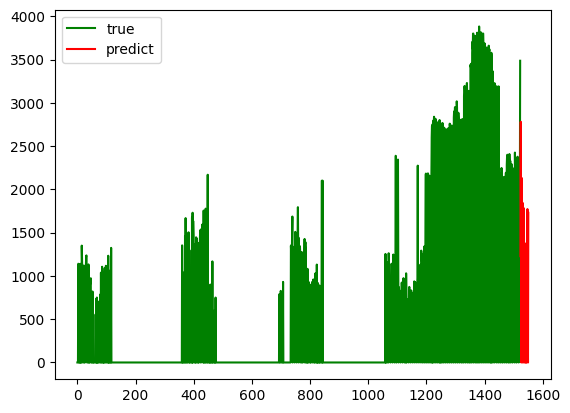

(1523, 7)
1315
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


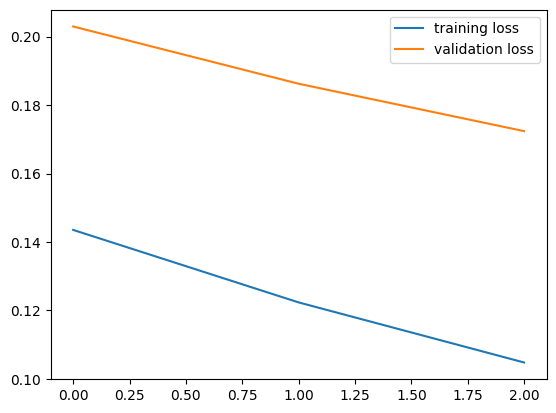

forcasting


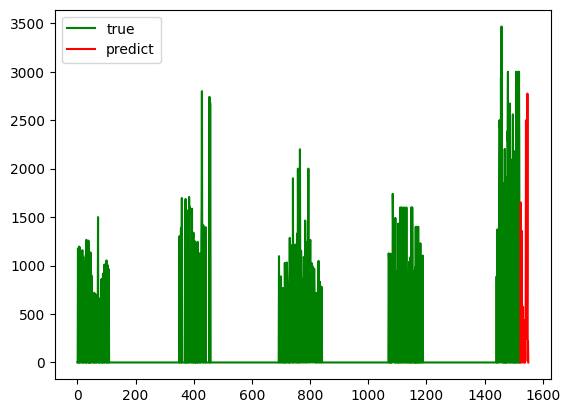

(1523, 7)
1185
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


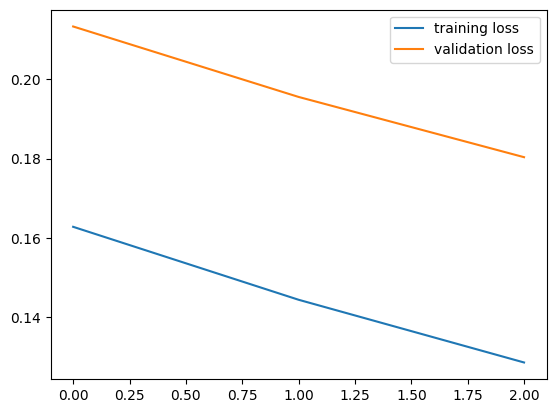

forcasting


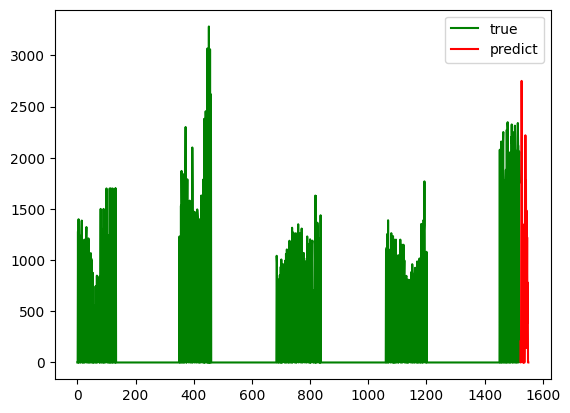

(1523, 7)
1028
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


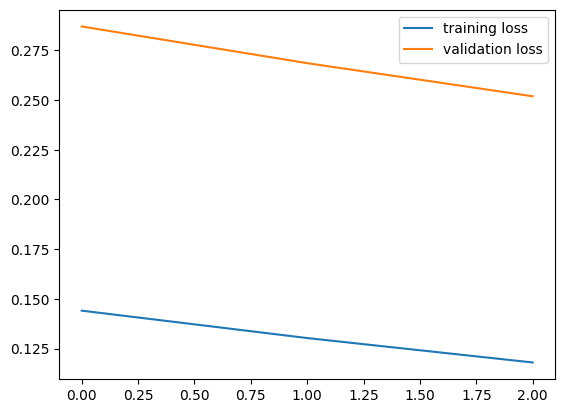

forcasting


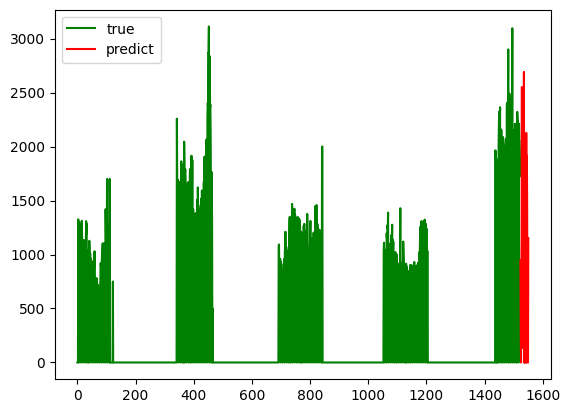

(1523, 7)
1515
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


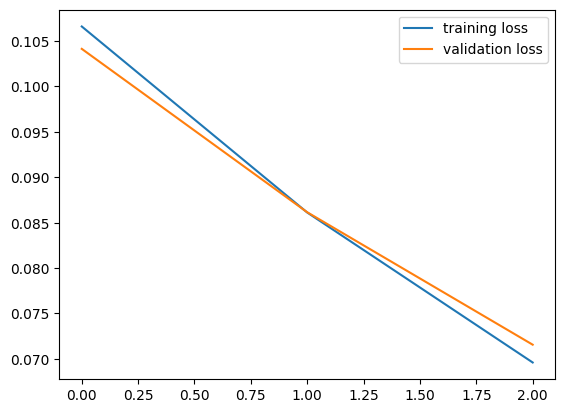

forcasting


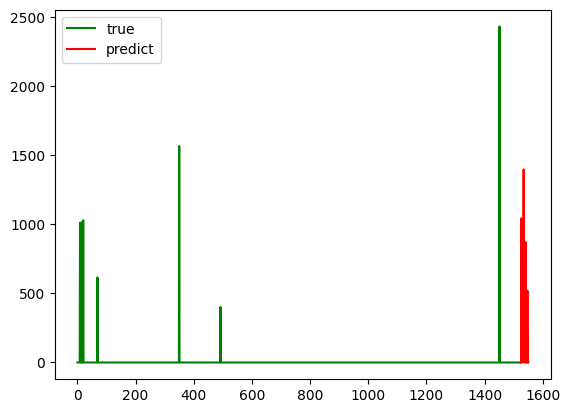

(1523, 7)
1038
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


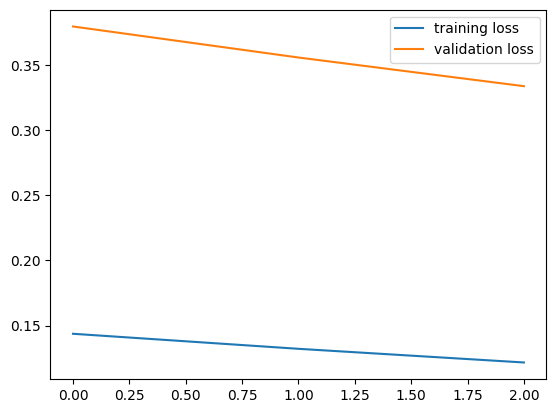

forcasting


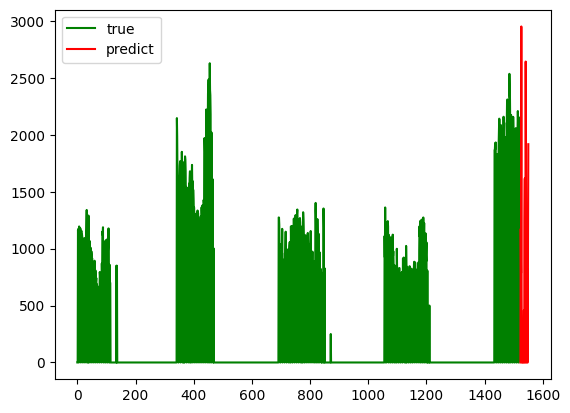

(1523, 7)
1495
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


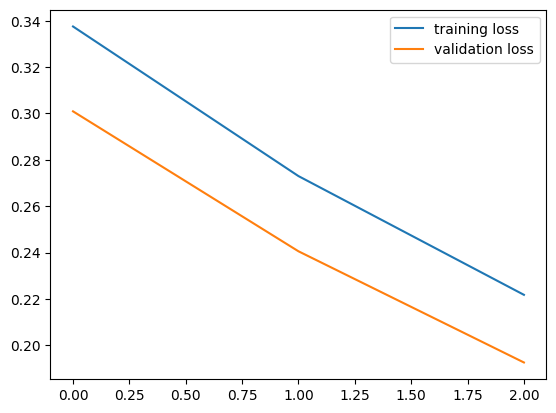

forcasting


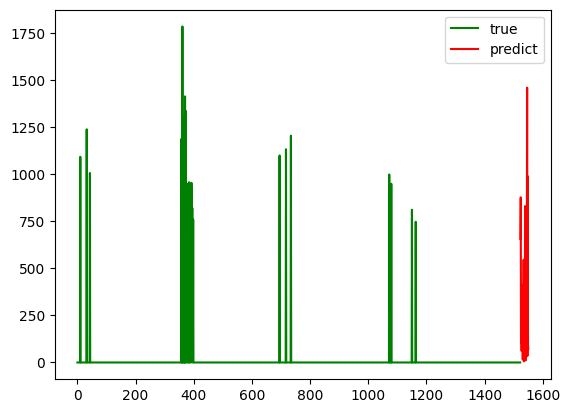

(1523, 7)
782
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


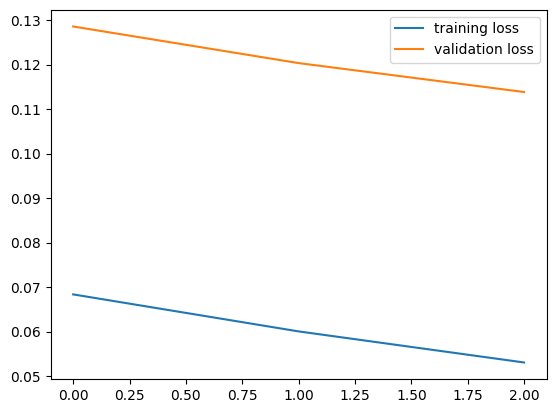

forcasting


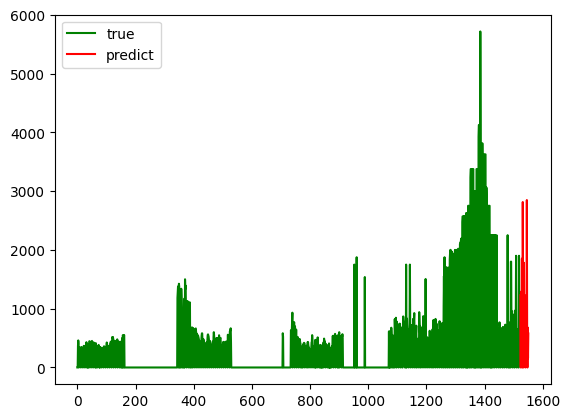

(1523, 7)
973
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


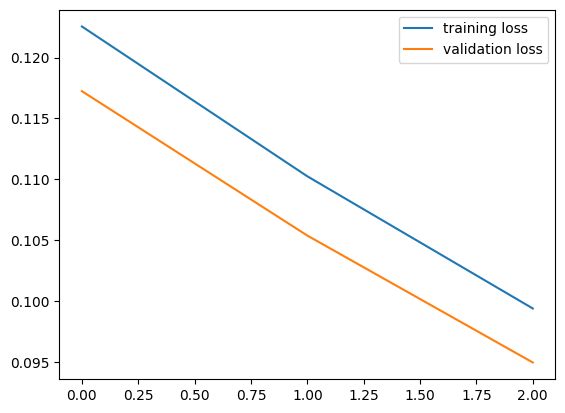

forcasting


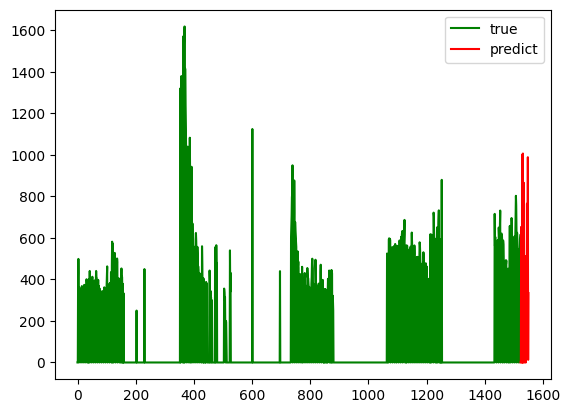

(1523, 7)
1499
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


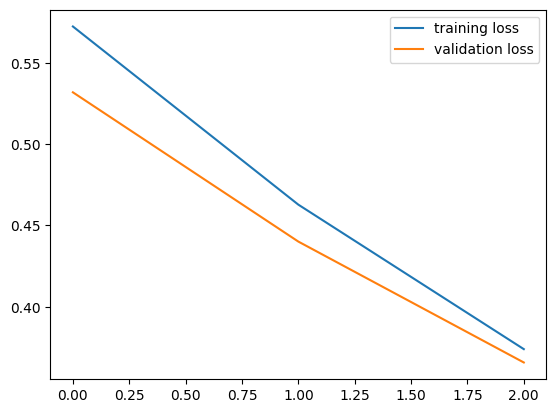

forcasting


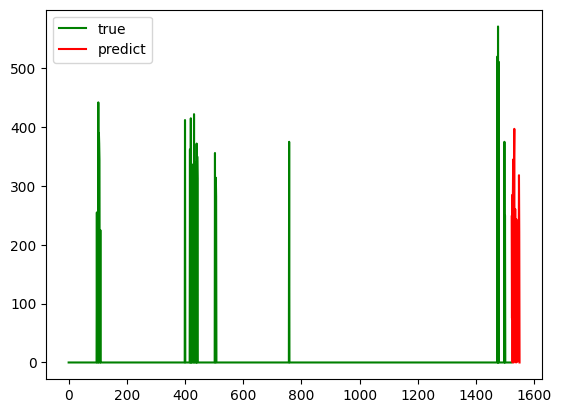

(1523, 7)
983
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


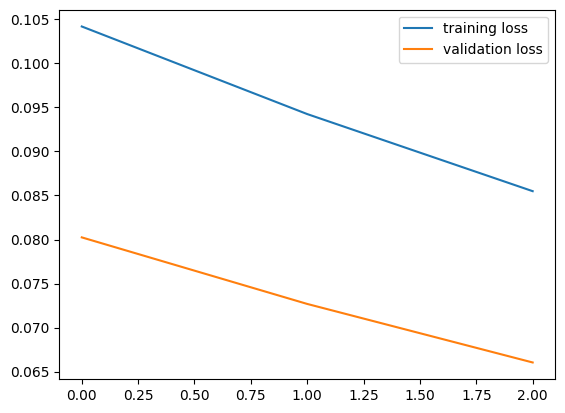

forcasting


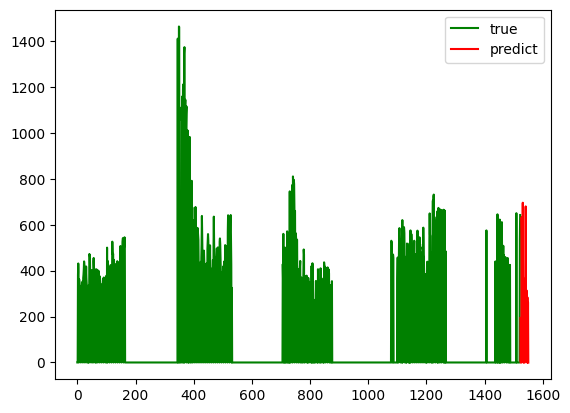

(1523, 7)
929
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


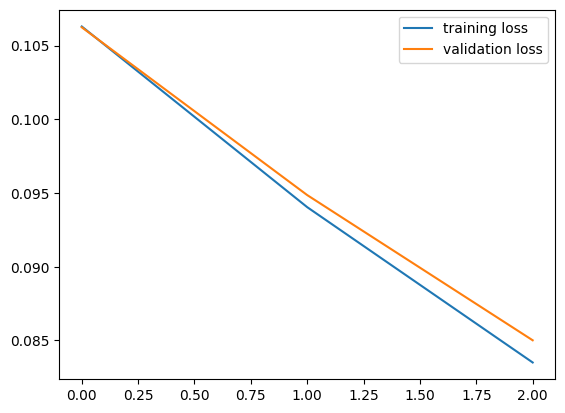

forcasting


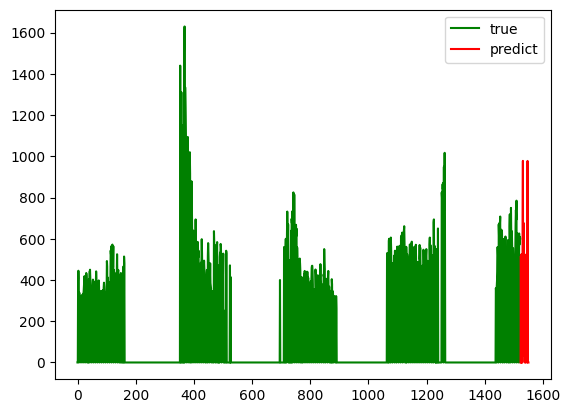

(1523, 7)
1046
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


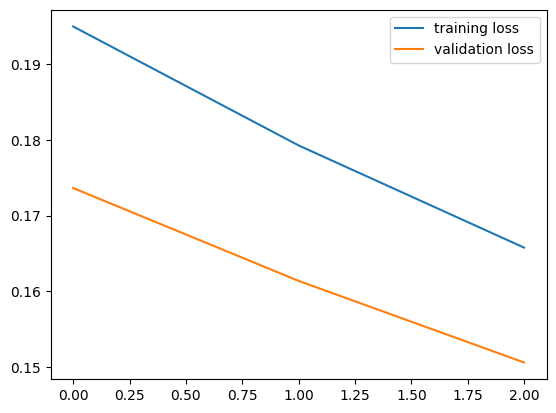

forcasting


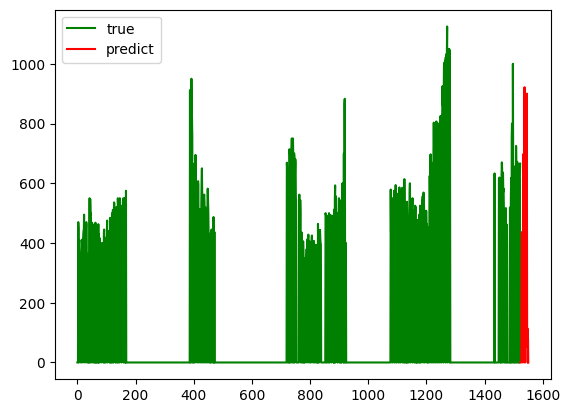

(1523, 7)
1212
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


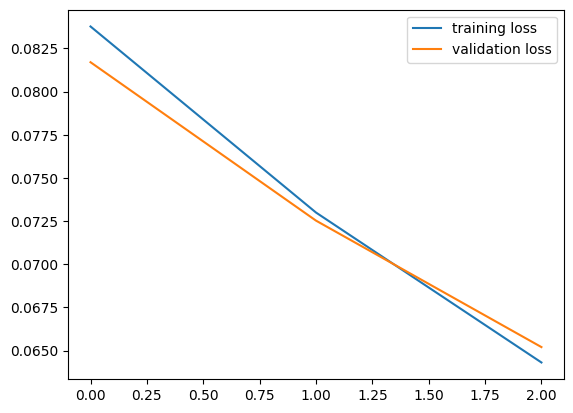

forcasting


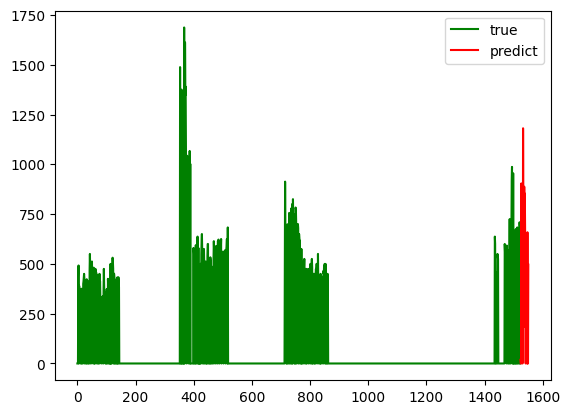

(1523, 7)
720
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


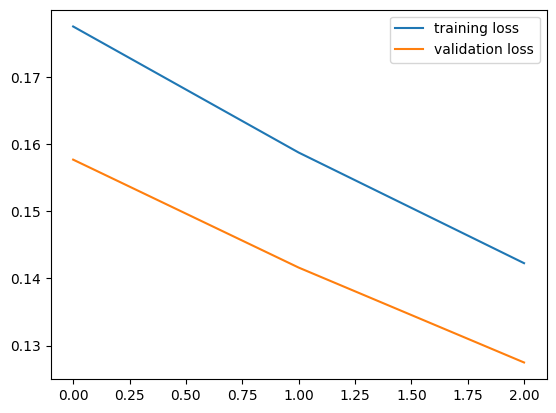

forcasting


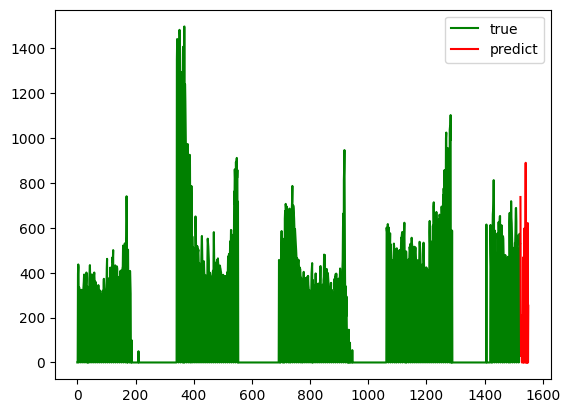

(1523, 7)
800
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


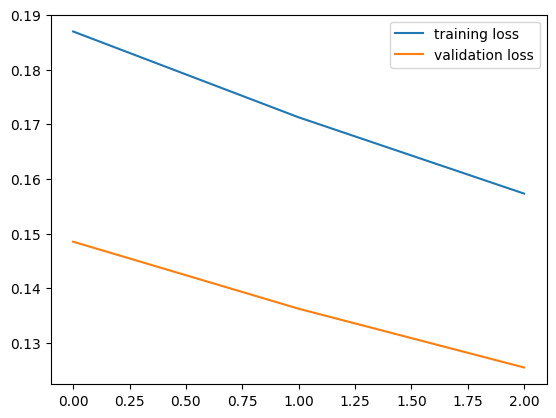

forcasting


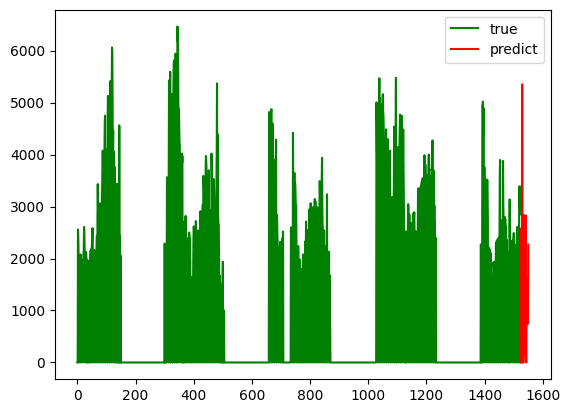

(1523, 7)
888
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


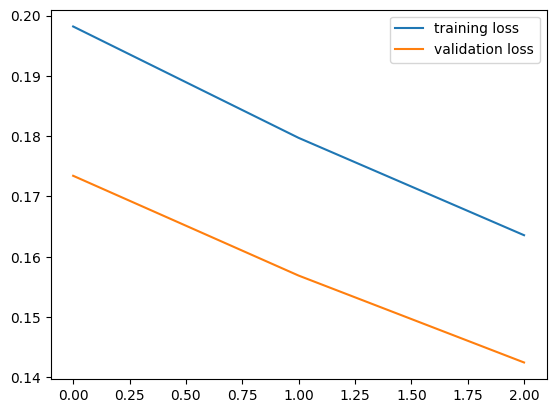

forcasting


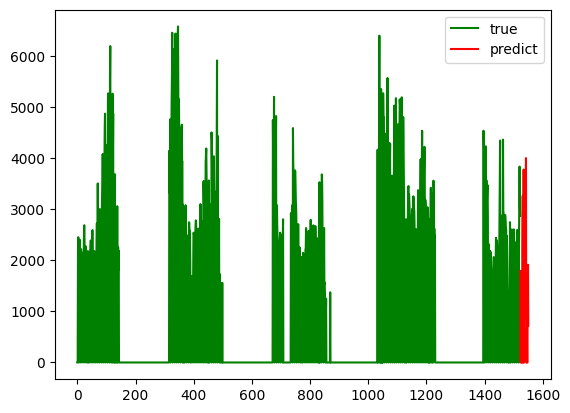

(1523, 7)
958
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


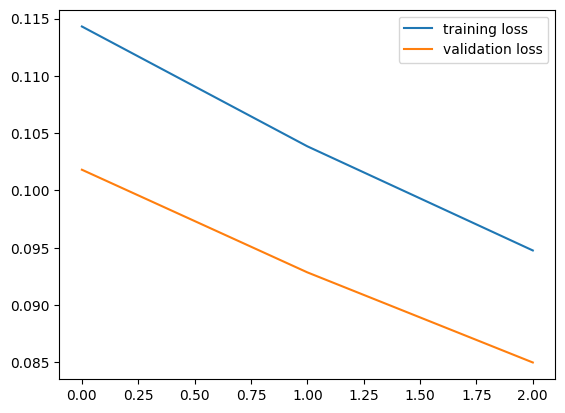

forcasting


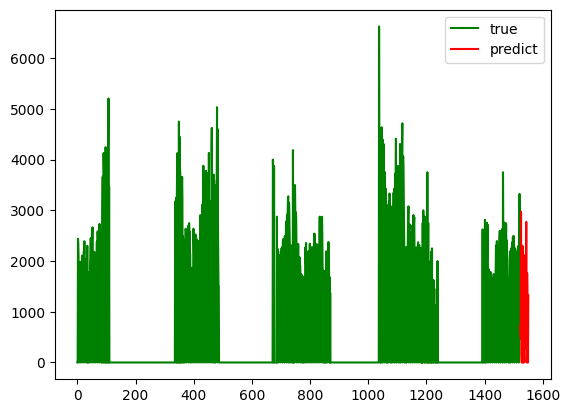

(1523, 7)
1476
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


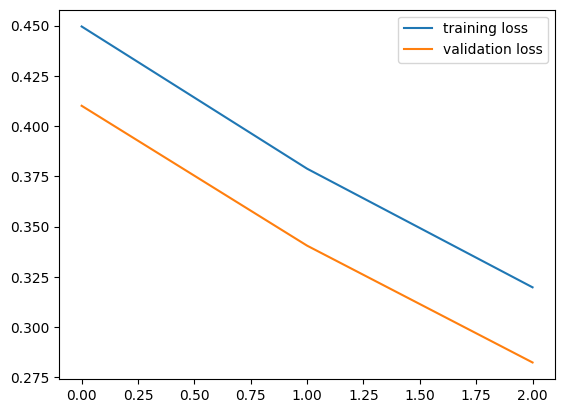

forcasting


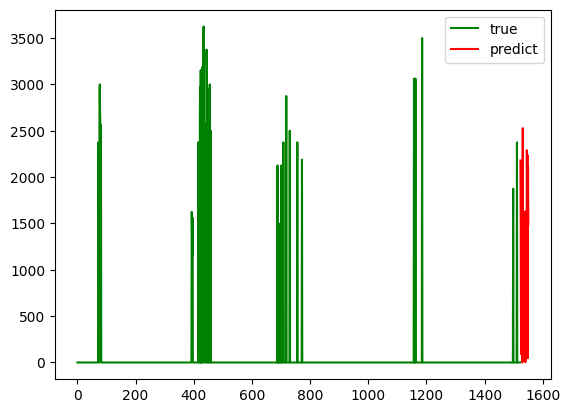

(1523, 7)
955
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


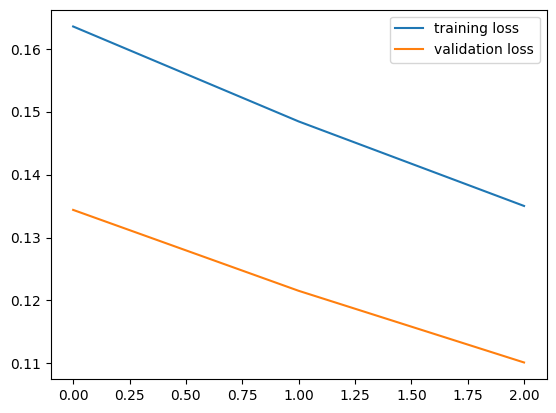

forcasting


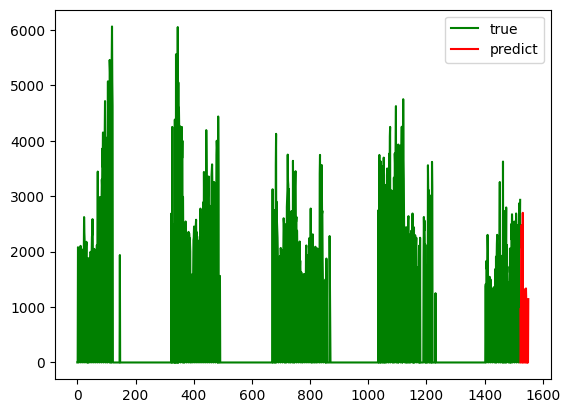

(1523, 7)
1499
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


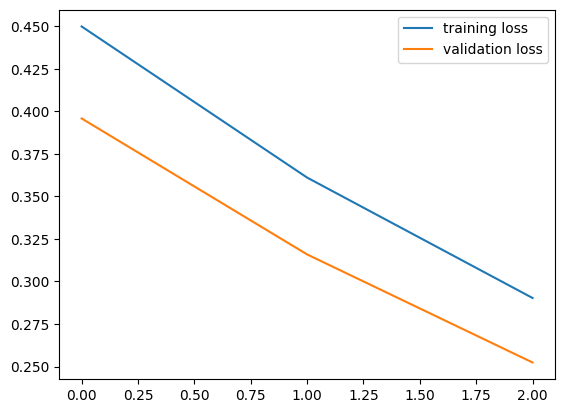

forcasting


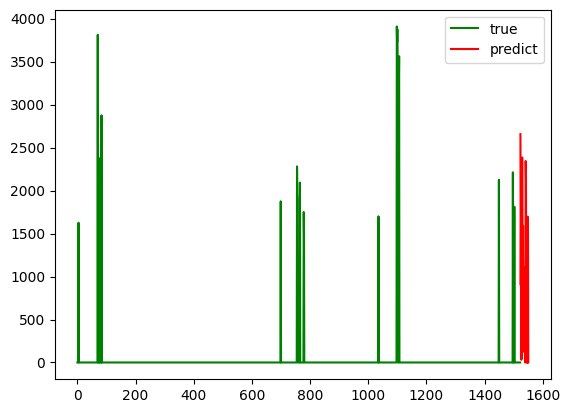

(1523, 7)
856
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


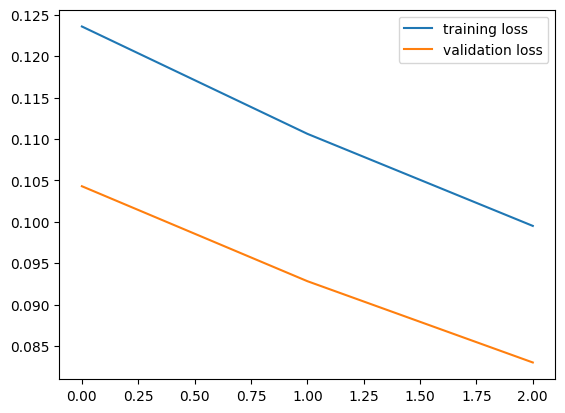

forcasting


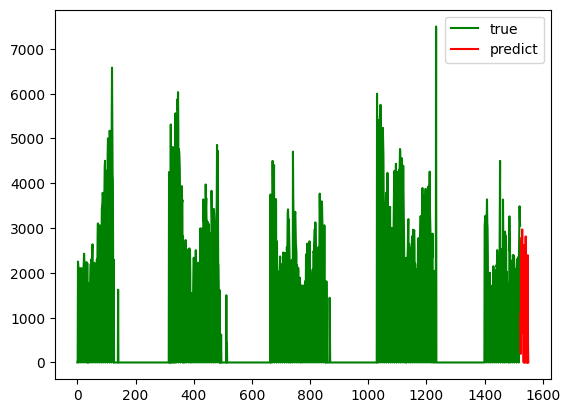

(1523, 7)
812
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


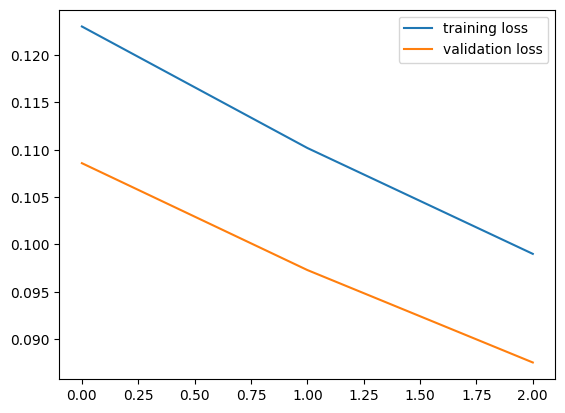

forcasting


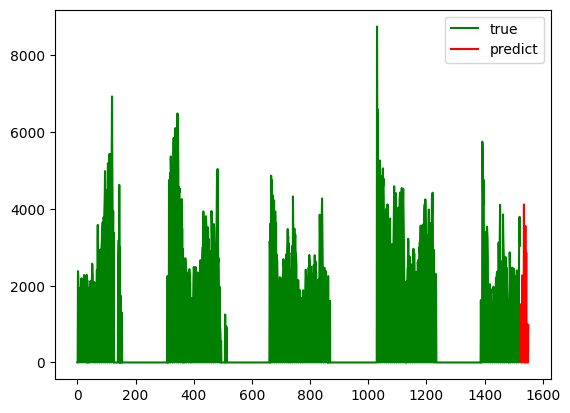

(1523, 7)
938
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


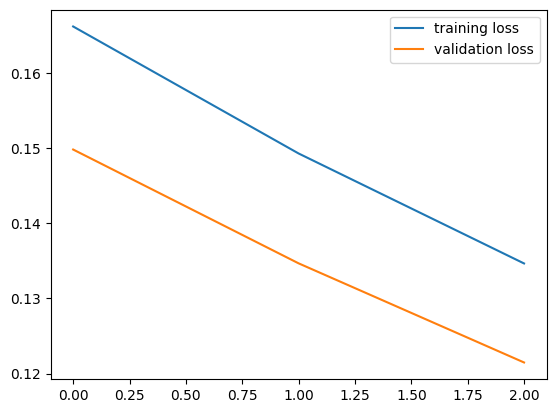

forcasting


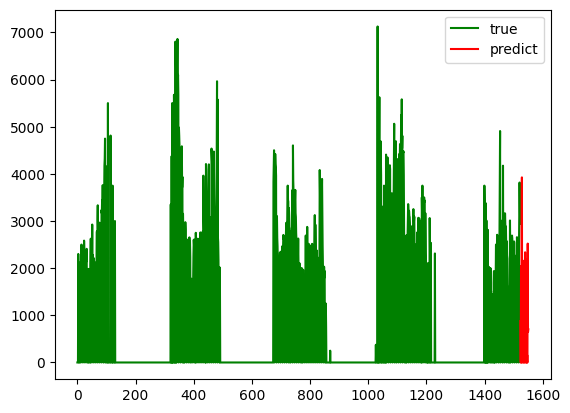

(1523, 7)
1181
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


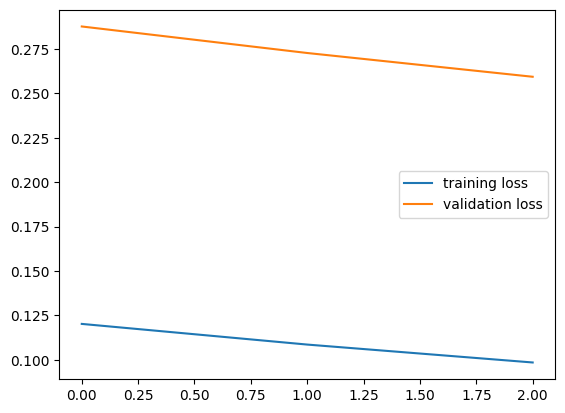

forcasting


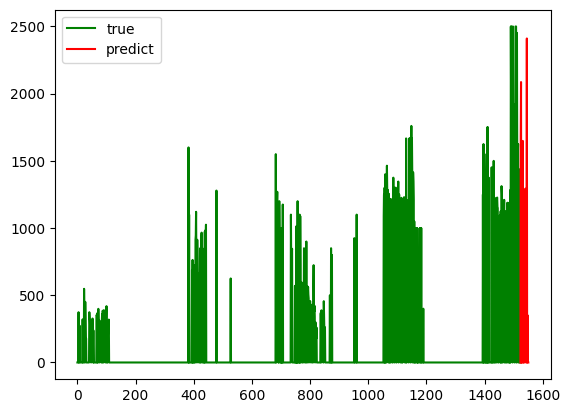

(1523, 7)
1484
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


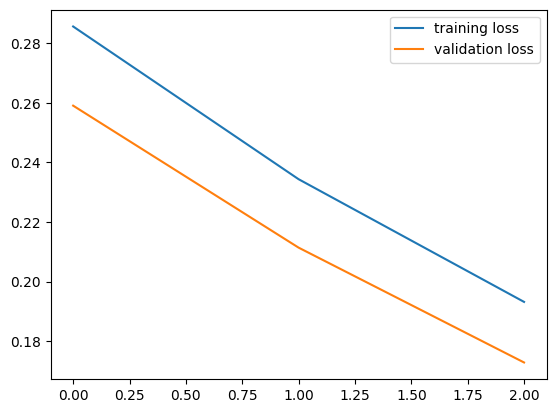

forcasting


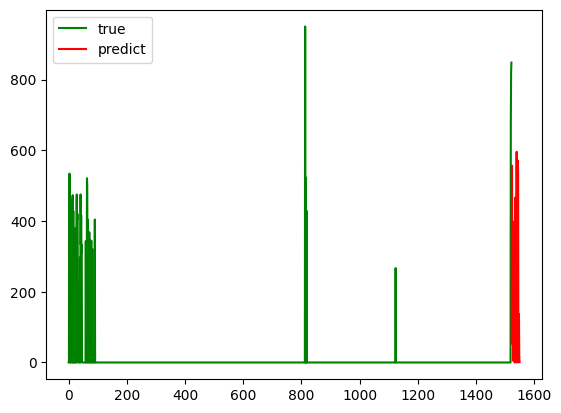

(1523, 7)
1245
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


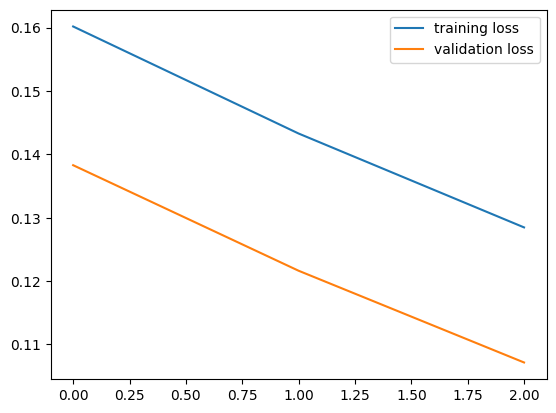

forcasting


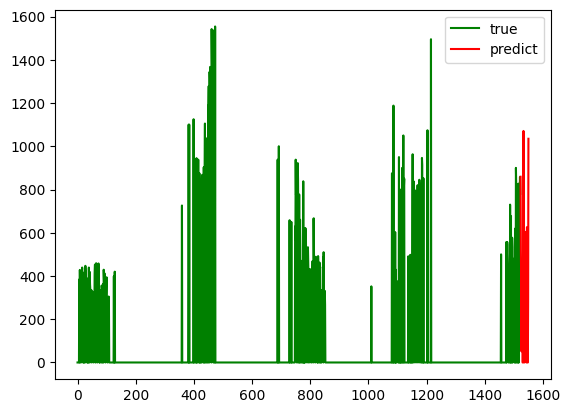

(1523, 7)
1147
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


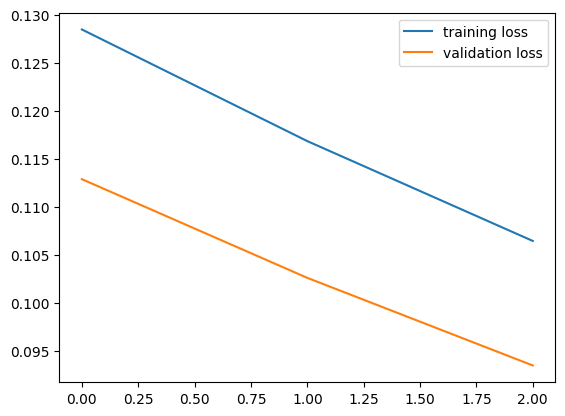

forcasting


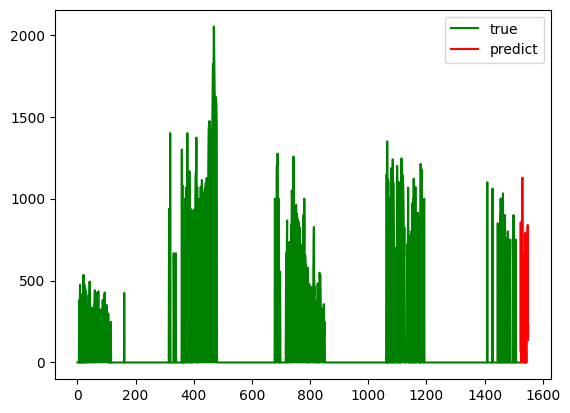

(1523, 7)
938
1337
(1337, 9, 16) (1337, 28) (149, 9, 16) (149, 28)


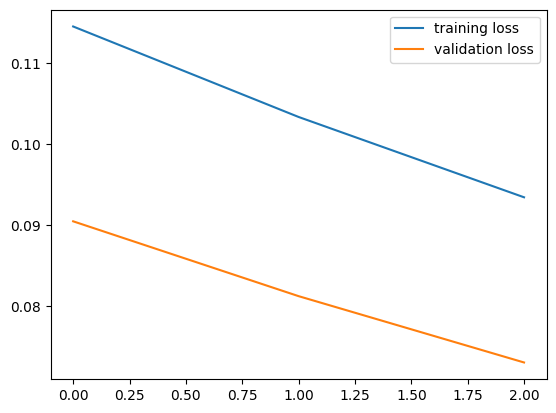

forcasting


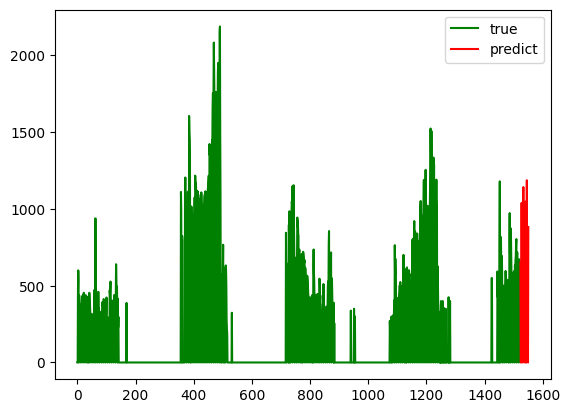

In [ ]:
forcastings = []
for col in pivot_train.columns[:-6]:

  temp = pivot_train[base_columns + [col]]
  print(temp.shape)

  temp[col] = temp[col].astype(float)

  # replace 0
  # temp[col] = temp[col].replace(0, np.NaN)
  # temp[col] = temp[col].interpolate().fillna(method = 'ffill').fillna(method = 'bfill')
  #avg = (temp[col].shift(-1) + temp[col].shift(1))/2
  #temp[col] = temp[col].mask(temp[col] == 0, avg).fillna(method = 'ffill').fillna(method = 'bfill')
  print(len(temp[temp[col] == 0]))

  # week lag
  temp[col+'_lag1'] = temp[col].shift(-1)
  temp[col+'_lag3'] = temp[col].shift(-3)
  temp[col+'_week1'] = temp[col].shift(-8)
  temp[col+'_week2'] = temp[col].shift(-15)
  temp[col+'_week4'] = temp[col].shift(-29)

  # rolling
  temp[col+'_rolling_mean'] = temp[col].rolling(5).mean()

  # # log
  # temp[col+'_log'] = np.log(temp[col])

  # residual
  stl = STL(temp[col], period = 12)
  res = stl.fit()
  #temp[col+'_resid'] = res.resid.values
  temp[col+'_trend'] = res.trend.values
  temp[col+'_seasonal'] = res.seasonal.values
  temp[col+'_residual'] = pivot_train[col] - (temp[col+'_trend'] + temp[col+'_seasonal'])

  temp = temp.drop(col, axis = 1)
  temp[col] = pivot_train[col]

  #print(temp.isnull().sum())

  temp = temp.fillna(0)
  #temp = temp.interpolate().fillna(0)
  #temp = temp.fillna(method = 'ffill').fillna(method = 'bfill')

  #print(temp.isnull().sum())

  # #Scaling
  scaled_prices, min_price, max_price = ZeroMinMaxScaling(temp.iloc[:, -1])
  scaled_prices = np.concatenate((temp.iloc[:, :-1], pd.DataFrame(scaled_prices)), axis = 1)
  #print(scaled_prices.shape)

  # X_train = scaled_prices[:, :-1]
  # Y_train = scaled_prices[:, -1]
  X_train, Y_train = sliding_window(scaled_prices, CFG['WINDOW_SIZE'], CFG['FORCAST_SIZE'])

  x_train, y_train, x_val, y_val = train_test_split(X_train, Y_train)
  print(x_train.shape, y_train.shape, x_val.shape, y_val.shape)

  # input_sequence_length = CFG['FORCAST_SIZE']
  # train_dataset = TimeSeriesDataset(x_train, y_train, input_sequence_length)
  # train_dataloader = DataLoader(train_dataset, batch_size=CFG['BATCH_SIZE'], shuffle=False)

  # val_dataset = TimeSeriesDataset(x_val, y_val, input_sequence_length)
  # val_dataloader = DataLoader(val_dataset, batch_size=CFG['BATCH_SIZE'], shuffle=False)

  train_dataset = CustomDataset(x_train, y_train)
  val_dataset = CustomDataset(x_val, y_val)

  train_dataloader = DataLoader(train_dataset, batch_size = CFG['BATCH_SIZE'], shuffle = False)
  val_dataloader = DataLoader(val_dataset, batch_size = CFG['BATCH_SIZE'], shuffle = False)

  input_size = x_train.shape[1]
  hidden_size = 50
  num_layers = 2

  model = LTSF_DLinear(
    window_size=CFG['WINDOW_SIZE'],
    forcast_size=CFG['FORCAST_SIZE'],
    kernel_size=25,
    individual=False,
    feature_size=1,
  )
  #model = LSTM(input_size = input_size, hidden_size = hidden_size, n_layers = num_layers, output_size = CFG['FORCAST_SIZE'])
  criterion = nn.MSELoss()
  optimizer = optim.AdamW(model.parameters(), lr = CFG['LEARNING_RATE'])

  model, train_history, val_history = batch_train_model(model, criterion, optimizer, train_dataloader, val_dataloader, device, num_epochs = CFG['EPOCHS'], patience = 5, forcast_size = CFG['FORCAST_SIZE'], min_price = min_price, max_price = max_price)

  with torch.no_grad():
    last_validation_sequence = torch.tensor(X_train[-1]).unsqueeze(0).to(device)
    last_validation_sequence = model(last_validation_sequence).squeeze(0)

  #forcasting = Inverse_ZScaling(last_validation_sequence.cpu().numpy(), std_price, mean_price)
  forcasting = InverseMinMaxScaling(last_validation_sequence.cpu().numpy(), min_price, max_price)
  #forcasting = last_validation_sequence.detach().cpu().numpy()
  forcasting[forcasting < last_validation_sequence.cpu().numpy().min()] = 0
  forcastings.append(forcasting)

  plt.plot(train_history, label = 'training loss')
  plt.plot(val_history, label = 'validation loss')
  plt.legend()
  plt.show()

  print('forcasting')

  plt.plot(range(0, temp.shape[0]), temp.iloc[:, -1].values, label = 'true', color = 'green')
  plt.plot(range(temp.shape[0], temp.iloc[:, -1].values.shape[0]+28), forcasting, label = 'predict', color = 'red')
  plt.legend()
  plt.show()

In [ ]:
sample_submission['answer'] = np.array(forcastings).reshape(-1, 1)
sample_submission.to_csv('baseline.csv', index = False)

In [ ]:
# forcastings = []
# for col in pivot_train.columns[1:-9]:

#   temp = pivot_train[base_columns + [col]]

#   #Scaling
#   scaled_prices, min_price, max_price = ZeroMinMaxScaling(temp.iloc[:, -1])
#   scaled_prices = np.concatenate((temp.iloc[:, :-1], pd.DataFrame(scaled_prices)), axis = 1)
#   print(scaled_prices.shape)

#   window_size = 7
#   test_sequences_size = 28
#   X_train, y_train = sliding_window(scaled_prices, window_size, test_sequences_size)

#   X_train = torch.tensor(X_train, dtype = torch.float32)
#   y_train = torch.tensor(y_train, dtype = torch.float32)

#   print(X_train.shape, y_train.shape)

#   X_train_tensor, y_train_tensor, X_val_tensor, y_val_tensor = train_test_split(X_train, y_train, 0.8)

#   print(X_train_tensor.shape, y_train_tensor.shape, X_val_tensor.shape, y_val_tensor.shape)

#   input_size = X_train_tensor.shape[2]
#   hidden_size = 50
#   num_layers = 2
#   output_size = test_sequences_size

#   model = LSTM(input_size = input_size, hidden_size = hidden_size, n_layers = num_layers, output_size = output_size)
#   criterion = RMSELoss() #nn.MSELoss()
#   optimizer = optim.Adam(model.parameters(), lr = 0.001)
#   num_epochs = 1000

#   model, train_history, val_history = train_model(model, criterion, optimizer, X_train_tensor, y_train_tensor, X_val_tensor, y_val_tensor, num_epochs = num_epochs, patience = 50)

#   last_validation_sequence = torch.tensor(X_val_tensor[-1])
#   with torch.no_grad():
#       last_validation_sequence = model(last_validation_sequence.unsqueeze(0)).squeeze(0)

#   #forcasting = Inverse_ZScaling(last_validation_sequence.numpy(), std_price, mean_price)
#   forcasting = InverseMinMaxScaling(last_validation_sequence.numpy(), min_price, max_price)
#   forcasting[forcasting <= 0] = 0
#   forcastings.append(forcasting)

#   plt.plot(train_history, label = 'training loss')
#   plt.plot(val_history, label = 'validation loss')
#   plt.legend()
#   plt.show()

#   print('forcasting')

#   plt.plot(range(0, temp.shape[0]), temp.values, label = 'true', color = 'green')
#   plt.plot(range(temp.shape[0], temp.values.shape[0]+28), forcasting, label = 'predict', color = 'red')
#   plt.legend()
#   plt.show()

In [ ]:
sample_submission['answer'] = np.array(forcastings).reshape(-1, 1)
sample_submission.to_csv('baseline.csv', index = False)